# Aula 1

In [1]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_theme(style="darkgrid")
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
plt.rcParams["figure.figsize"] = (14,10)
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
import folium
from sklearn.preprocessing import scale
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

In [3]:
url = "https://gist.githubusercontent.com/tgcsantos/3bdb29eba6ce391e90df2b72205ba891/raw/22fa920e80c9fa209a9fccc8b52d74cc95d1599b/dados_imoveis.csv"
dados = pd.read_csv(url)

In [4]:
dados.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000


In [5]:
dados.sample(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
100,Rua Pero Correia,Vila Mariana,São Paulo,250,3,3,1,R$ 1.350.000
7602,NaN,Lar São Paulo,São Paulo,334,3,3,4,R$ 1.696.000
8109,NaN,Vila Moraes,São Paulo,168,2,1,3,R$ 630.000


In [6]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10008 entries, 0 to 10007
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Rua        6574 non-null   object
 1   Bairro     9996 non-null   object
 2   Cidade     10008 non-null  object
 3   Metragem   10008 non-null  int64 
 4   Quartos    10008 non-null  int64 
 5   Banheiros  10008 non-null  int64 
 6   Vagas      10008 non-null  int64 
 7   Valor      10008 non-null  object
dtypes: int64(4), object(4)
memory usage: 625.6+ KB


In [7]:
dados["Bairro"][6522]

'Vila Paulo Silas'

In [8]:
dados.Metragem.mean()

442.30065947242207

In [9]:
dados["Metragem"].mean()

442.30065947242207

In [10]:
sum((dados["Bairro"] == "Vila Mariana"))

184

In [11]:
tem_imoveis_vila =( dados["Bairro"] == "Vila Mariana")
tem_imoveis_vila

0        False
1        False
2        False
3        False
4        False
         ...  
10003    False
10004    False
10005    False
10006    False
10007    False
Name: Bairro, Length: 10008, dtype: bool

In [12]:
imoveis_vila_mariana = dados[tem_imoveis_vila]
imoveis_vila_mariana.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
100,Rua Pero Correia,Vila Mariana,São Paulo,250,3,3,1,R$ 1.350.000
120,Praça Doutor Carvalho Franco,Vila Mariana,São Paulo,250,3,5,2,R$ 2.450.000
155,Rua Professor João Marinho,Vila Mariana,São Paulo,170,3,4,2,R$ 1.490.000


In [13]:
imoveis_vila_mariana["Metragem"].mean()

233.6195652173913

In [14]:
dados["Bairro"].value_counts()

Alto de Pinheiros     409
Jardim Guedala        403
Jardim Paulista       309
Brooklin Paulista     247
Jardim Europa         240
                     ... 
Jardim das Imbuias      1
Vila Represa            1
Vila Nancy              1
Sítio Represa           1
Vila Invernada          1
Name: Bairro, Length: 701, dtype: int64

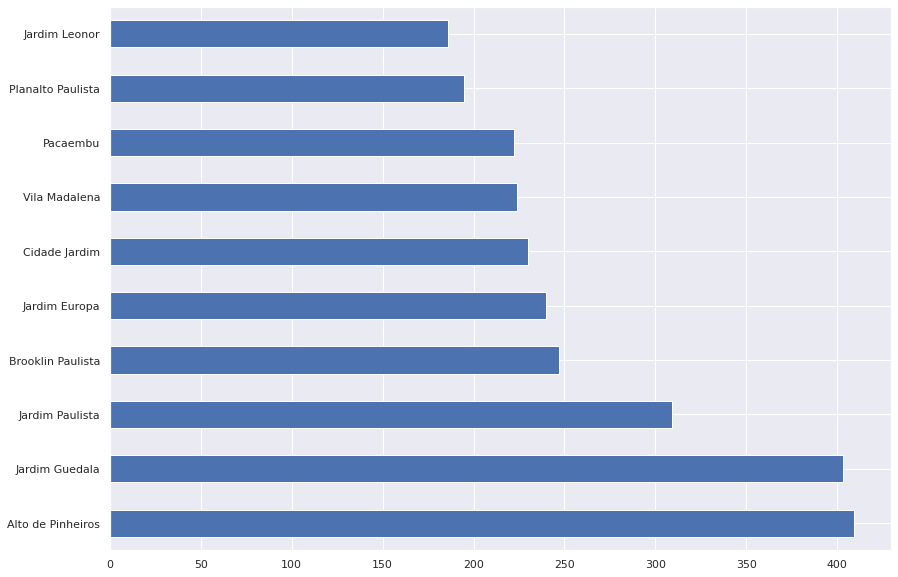

In [15]:
n_imoveis_bairro = dados["Bairro"].value_counts()
n_imoveis_bairro.head(10).plot.barh()

Desafios:


## Desafios

1.   Realizar a média da metragem para cara um dos bairros
2.   2 formas de selecionar os dados por bairro (consultar os métodos na documentação do pandas)
3.   Explorar alguns gráficos na documentação e aplicar nas demais colunas do DF, tentar colocar alguma conclusão
4.   Pegar outros estatísticas dos dados, média, mediana, mim, max
5.   Descobrir quais são os bairros que não tem nome de Rua.


### Desafio 1

Realizar a média da metragem para cara um dos bairros

In [16]:
dados.groupby('Bairro')['Metragem'].mean().sort_values(ascending=False)

Bairro
Sítio Represa                         37000.000000
Vila Castelo                           2850.000000
Jardim Guedala                         2486.640199
Jardim das Camélias                    1700.000000
Chácara Flora                          1260.727273
                                          ...     
Cidade Antônio Estevão de Carvalho       57.500000
Jardim Nova Germania                     57.000000
Jardim Benfica                           48.000000
Vila Leonor                              46.000000
Vila Guaca                               10.000000
Name: Metragem, Length: 701, dtype: float64

### Desafio 2

2 formas de selecionar os dados por bairro (consultar os métodos na documentação do pandas)

In [17]:
dados.groupby('Bairro')['Bairro'].count().sort_values(ascending=False)

Bairro
Alto de Pinheiros    409
Jardim Guedala       403
Jardim Paulista      309
Brooklin Paulista    247
Jardim Europa        240
                    ... 
Vila Fernandes         1
Vila Fiat Lux          1
Educandário            1
Vila Guaca             1
Jardim Guapira         1
Name: Bairro, Length: 701, dtype: int64

In [18]:
dados.query('Bairro == "Vila Clarice"')

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
66,"Rua Major Alfredo Romão, 92",Vila Clarice,São Paulo,99,3,2,2,R$ 650.000
6710,"Rua Manuel Antônio Carvalho, 1",Vila Clarice,São Paulo,90,3,2,2,R$ 398.000


In [19]:
dados[dados['Bairro'] == "Vila Clarice"]

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
66,"Rua Major Alfredo Romão, 92",Vila Clarice,São Paulo,99,3,2,2,R$ 650.000
6710,"Rua Manuel Antônio Carvalho, 1",Vila Clarice,São Paulo,90,3,2,2,R$ 398.000


### Desafio 3

Explorar alguns gráficos na documentação e aplicar nas demais colunas do DF, tentar colocar alguma conclusão

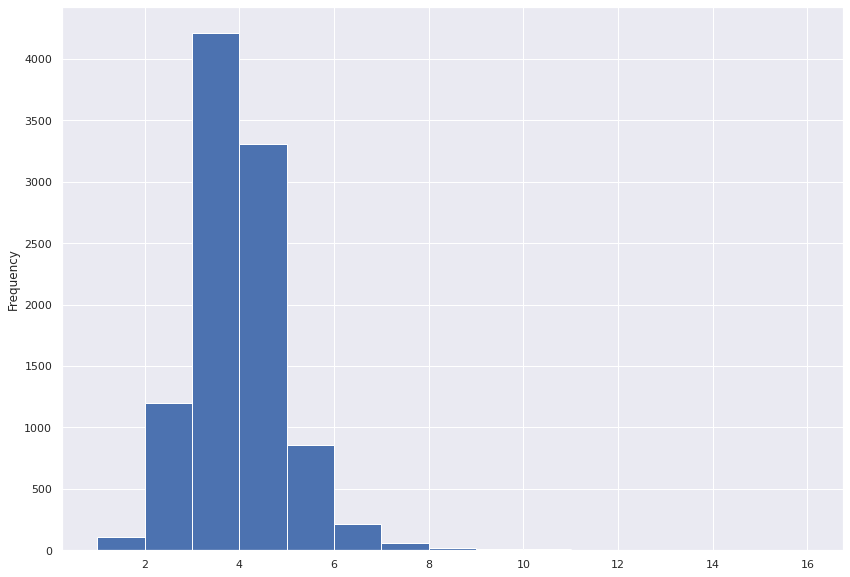

In [20]:
dados['Quartos'].plot.hist(bins=len(dados['Quartos'].unique()))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


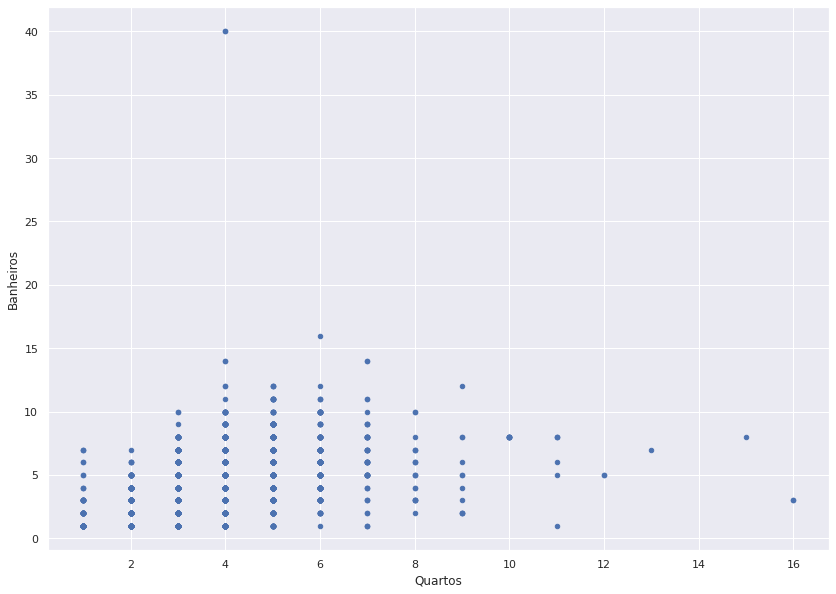

In [21]:
dados.plot.scatter(x='Quartos',
                   y = "Banheiros")

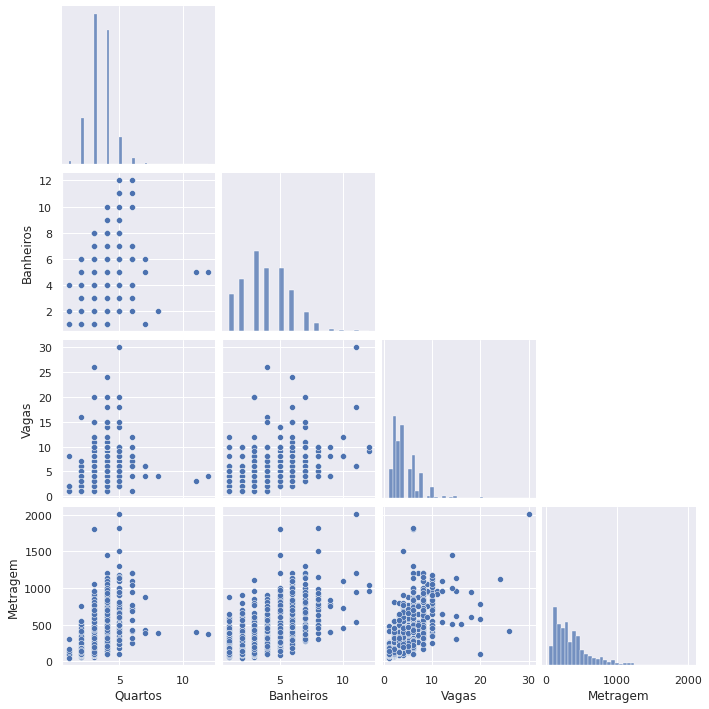

In [22]:
%matplotlib inline
sns.pairplot(dados[['Quartos', 'Banheiros','Vagas','Metragem']].sample(1000), corner=True)
plt.show()

### Desafio 4
Pegar outros estatísticas dos dados, média, mediana, mim, max

In [23]:
dados_tratados = dados.copy(deep=True)
dados_tratados['Valor'] = dados_tratados['Valor'].str.replace(r'\D', '').astype(int)
dados_tratados.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000


In [24]:
dados_tratados.describe()

,Metragem,Quartos,Banheiros,Vagas,Valor
count,10008.000000,10008.000000,10008.000000,10008.000000,1.000800e+04
mean,442.300659,3.483114,3.879097,4.097222,2.794170e+06
std,7515.379389,1.064200,1.988467,2.824014,3.866249e+06
min,10.000000,1.000000,1.000000,1.000000,1.650000e+03
25%,173.000000,3.000000,2.000000,2.000000,7.500000e+05
50%,290.000000,3.000000,4.000000,4.000000,1.600000e+06
75%,460.250000,4.000000,5.000000,5.000000,3.350000e+06
max,750000.000000,16.000000,40.000000,50.000000,6.500000e+07


In [25]:
dados_tratados.agg({"Metragem":['min','max','mean','median'],
           "Quartos":['min','max','mean','median'],
           "Banheiros":['min','max','mean','median'],
           "Vagas":['min','max','mean','median'],
           "Valor":['min','max','mean','median']})

,Metragem,Quartos,Banheiros,Vagas,Valor
min,10.000000,1.000000,1.000000,1.000000,1.650000e+03
max,750000.000000,16.000000,40.000000,50.000000,6.500000e+07
mean,442.300659,3.483114,3.879097,4.097222,2.794170e+06
median,290.000000,3.000000,4.000000,4.000000,1.600000e+06


### Desafio 5

Descobrir quais são os bairros que não tem nome de Rua.

In [26]:
bairros_sem_rua = dados[dados['Rua'].isna()].Bairro.value_counts()
bairros_sem_rua

Jardim Guedala                      190
Alto de Pinheiros                   169
Jardim Paulista                     138
Jardim Europa                       128
Jardim Leonor                       118
                                   ... 
Jardim do Colégio (Zona Norte)        1
Alto da Boa Vista                     1
Jardim Aeroporto                      1
Conjunto Residencial Vista Verde      1
Jardim Santo Elias                    1
Name: Bairro, Length: 394, dtype: int64

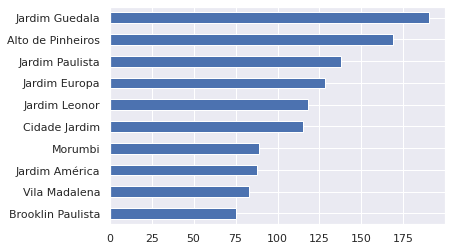

In [27]:
bairros_sem_rua.head(10).sort_values().plot.barh()

# Aula 2

In [28]:
dados.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000


In [29]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10008 entries, 0 to 10007
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Rua        6574 non-null   object
 1   Bairro     9996 non-null   object
 2   Cidade     10008 non-null  object
 3   Metragem   10008 non-null  int64 
 4   Quartos    10008 non-null  int64 
 5   Banheiros  10008 non-null  int64 
 6   Vagas      10008 non-null  int64 
 7   Valor      10008 non-null  object
dtypes: int64(4), object(4)
memory usage: 625.6+ KB


In [30]:
dados["Valor"][0]

'R$ 7.000.000'

In [31]:
dados["Valor"].str.split(expand = True)

,0,1,2
0,R$,7.000.000,None
1,R$,3.700.000,None
2,R$,380.000,None
3,R$,685.000,None
4,R$,540.000,None
...,...,...,...
10003,R$,665.000,None
10004,R$,2.300.000,None
10005,R$,1.050.000,None
10006,R$,2.200,/Mês


In [32]:
len(dados["Valor"].str.split(expand = True)[1].unique())

1038

In [33]:
dados["Valor"].str.split(expand = True)[2].unique()

array([None, '/Mês', '/Ano', '/Dia'], dtype=object)

In [34]:
dados[["Valor", "Bairro"]]

,Valor,Bairro
0,R$ 7.000.000,Planalto Paulista
1,R$ 3.700.000,Jardim dos Estados
2,R$ 380.000,Jardim Reimberg
3,R$ 685.000,Jardim Morumbi
4,R$ 540.000,Mooca
...,...,...
10003,R$ 665.000,Vila Sofia
10004,R$ 2.300.000,Bosque da Saúde
10005,R$ 1.050.000,Vila da Saúde
10006,R$ 2.200\n /Mês,Vila Oratório


In [35]:
dados[["Moeda", "Valor_anuncio", "Tipo_anuncio"]] = dados["Valor"].str.split(expand = True)
dados.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,R$ 685.000,R$,685.000,None
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,R$ 540.000,R$,540.000,None


In [36]:
dados[dados["Tipo_anuncio"].isnull()]["Tipo_anuncio"].unique()

array([None], dtype=object)

In [37]:
dados_vendas = dados[dados["Tipo_anuncio"].isnull()]
dados_vendas.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None


In [38]:
dados_vendas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9156 entries, 0 to 10007
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Rua            6107 non-null   object
 1   Bairro         9146 non-null   object
 2   Cidade         9156 non-null   object
 3   Metragem       9156 non-null   int64 
 4   Quartos        9156 non-null   int64 
 5   Banheiros      9156 non-null   int64 
 6   Vagas          9156 non-null   int64 
 7   Valor          9156 non-null   object
 8   Moeda          9156 non-null   object
 9   Valor_anuncio  9156 non-null   object
 10  Tipo_anuncio   0 non-null      object
dtypes: int64(4), object(7)
memory usage: 858.4+ KB


In [39]:
dados_vendas["Valor_anuncio"].str.replace(".","").astype(float)

0        7000000.0
1        3700000.0
2         380000.0
3         685000.0
4         540000.0
           ...    
10002    1500000.0
10003     665000.0
10004    2300000.0
10005    1050000.0
10007     270000.0
Name: Valor_anuncio, Length: 9156, dtype: float64

In [40]:
dados_vendas["Valor_anuncio_float"] = dados_vendas["Valor_anuncio"].str.replace(".","").astype(float)

In [41]:
dados_vendas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9156 entries, 0 to 10007
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Rua                  6107 non-null   object 
 1   Bairro               9146 non-null   object 
 2   Cidade               9156 non-null   object 
 3   Metragem             9156 non-null   int64  
 4   Quartos              9156 non-null   int64  
 5   Banheiros            9156 non-null   int64  
 6   Vagas                9156 non-null   int64  
 7   Valor                9156 non-null   object 
 8   Moeda                9156 non-null   object 
 9   Valor_anuncio        9156 non-null   object 
 10  Tipo_anuncio         0 non-null      object 
 11  Valor_anuncio_float  9156 non-null   float64
dtypes: float64(1), int64(4), object(7)
memory usage: 929.9+ KB


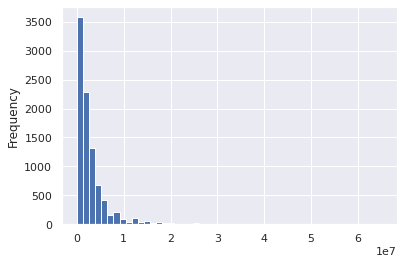

In [42]:
dados_vendas["Valor_anuncio_float"].plot.hist(bins = 50)

In [43]:
pd.set_option("display.precision", 2)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

dados_vendas.describe()

,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float
count,9156.00,9156.00,9156.00,9156.00,9156.00
mean,434.42,3.45,3.80,3.96,3052202.96
std,7856.42,1.05,1.97,2.60,3944208.19
min,10.00,1.00,1.00,1.00,13000.00
25%,168.00,3.00,2.00,2.00,890000.00
50%,276.00,3.00,4.00,4.00,1800000.00
75%,450.00,4.00,5.00,5.00,3500000.00
max,750000.00,16.00,40.00,50.00,65000000.00


In [44]:
dados_vendas[["Rua", "Bairro", "Cidade"]].describe()

,Rua,Bairro,Cidade
count,6107,9146,9156
unique,3006,697,1
top,Rua Alberto Faria,Alto de Pinheiros,São Paulo
freq,24,369,9156


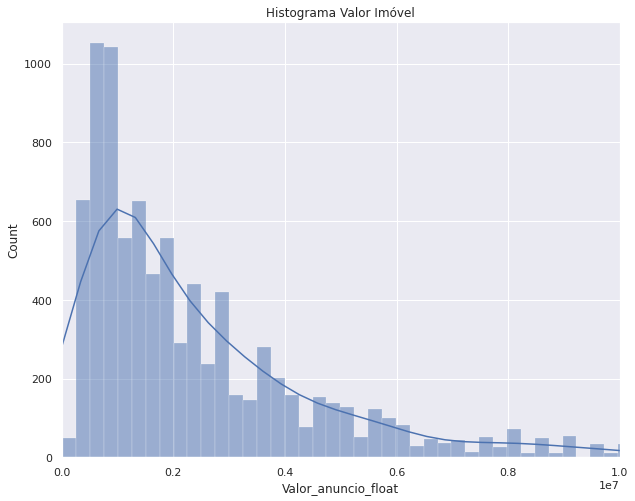

In [45]:
sns.set()
plt.figure(figsize=(10, 8))
ax = sns.histplot(data = dados_vendas, x = "Valor_anuncio_float", kde = True)
ax.set_title("Histograma Valor Imóvel")
plt.xlim((-50, 10000000))
plt.show()

## Desafios

1.   Criar uma escala de valores em milhões
2.   Deixar o gráfico do histograma de valores legível (alterar labels, cores, título, escala)
3.   Preço do metro quadrado por bairro e plotar em um gráfico ideal
4.   Explorar as bibliotecas de visualizações e colocar as suas conclusão
5.   Pesquisar um visualização para analisar os quartis, mediana e outliers

### Desafio 1 e 2

*   Criar uma escala de valores em milhões
*   Deixar o gráfico do histograma de valores legível (alterar labels, cores, título, escala)

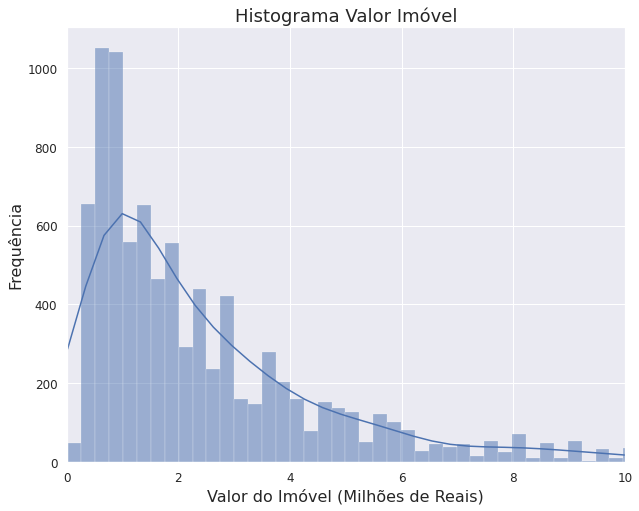

In [46]:
sns.set()
plt.figure(figsize=(10, 8))
ax = sns.histplot(data = dados_vendas, x = "Valor_anuncio_float", kde = True)
ax.set_title("Histograma Valor Imóvel",fontsize=18)
plt.xlim((-50, 10000000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000)))
ax.set_xlabel("Valor do Imóvel (Milhões de Reais)",fontsize=16)
ax.set_ylabel("Frequência",fontsize=16)
ax.tick_params(labelsize=12)
plt.show()

### Desafio 3

Preço do metro quadrado por bairro e plotar em um gráfico ideal

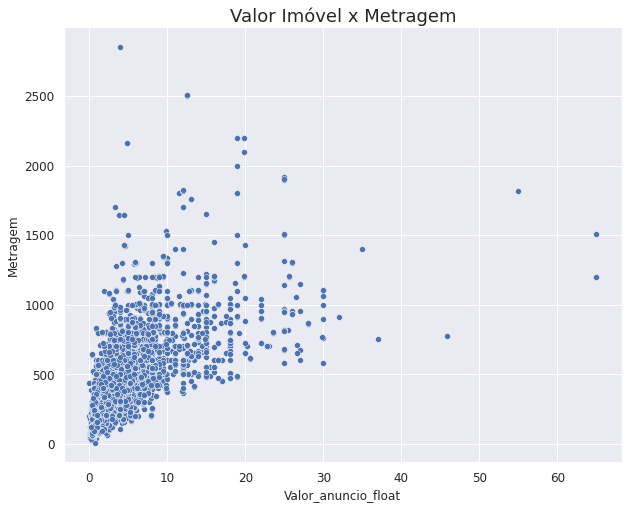

In [47]:
plt.figure(figsize=(10, 8))
ax = sns.scatterplot(data = dados_vendas[dados_vendas['Metragem']< 7000], x = "Valor_anuncio_float", y = "Metragem")
ax.set_title("Valor Imóvel x Metragem",fontsize=18)
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000)))
#ax.set_xlabel("Valor do Imóvel (Milhões de Reais)",fontsize=16)
#ax.set_ylabel("Frequência",fontsize=16)
ax.tick_params(labelsize=12)
plt.show()

In [48]:
dados_valor_metro = dados_vendas.groupby('Bairro').agg({"Valor_anuncio_float":"sum","Metragem":"sum"})
dados_valor_metro["Preco_por_Metro_Quadrado"] = dados_valor_metro["Valor_anuncio_float"]/dados_valor_metro["Metragem"]
dados_valor_metro = dados_valor_metro.reset_index()
dados_valor_metro.head(5)

,Bairro,Valor_anuncio_float,Metragem,Preco_por_Metro_Quadrado
0,Aclimação,139292801.00,19447,7162.69
1,Alto da Boa Vista,19130000.00,3351,5708.74
2,Alto da Lapa,166653500.00,23940,6961.30
3,Alto da Mooca,23683400.00,5401,4385.00
4,Alto de Pinheiros,1764815915.00,158616,11126.34


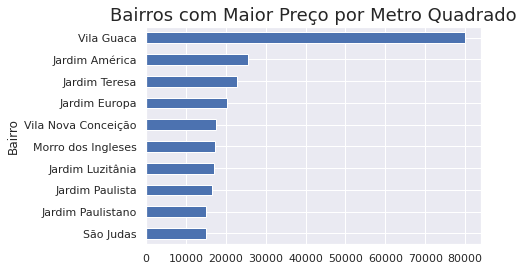

In [49]:
ax = dados_valor_metro.sort_values(by="Preco_por_Metro_Quadrado",ascending=False).head(10).sort_values(by="Preco_por_Metro_Quadrado",ascending=True).plot.barh(y="Preco_por_Metro_Quadrado",x="Bairro",legend=None)
ax.set_title("Bairros com Maior Preço por Metro Quadrado",fontsize=18)
plt.show()

In [50]:
dados_vendas["Valor_por_metro2"] = dados_vendas["Valor_anuncio_float"]/dados_vendas["Metragem"]

### Desafio 5
Pesquisar um visualização para analisar os quartis, mediana e outliers

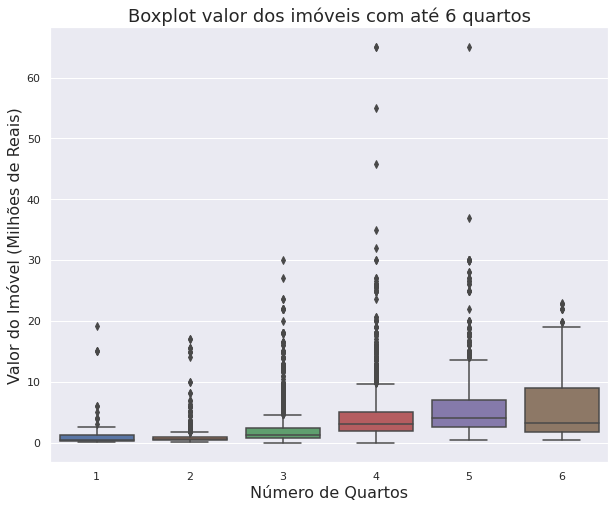

In [51]:
plt.figure(figsize=(10, 8))
ax = sns.boxplot(x="Quartos", y="Valor_anuncio_float", data=dados_vendas[dados_vendas['Quartos'] <= 6])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000)))
ax.set_title("Boxplot valor dos imóveis com até 6 quartos",fontsize=18)
ax.set_xlabel("Número de Quartos",fontsize=16)
ax.set_ylabel("Valor do Imóvel (Milhões de Reais)",fontsize=16)
plt.show()

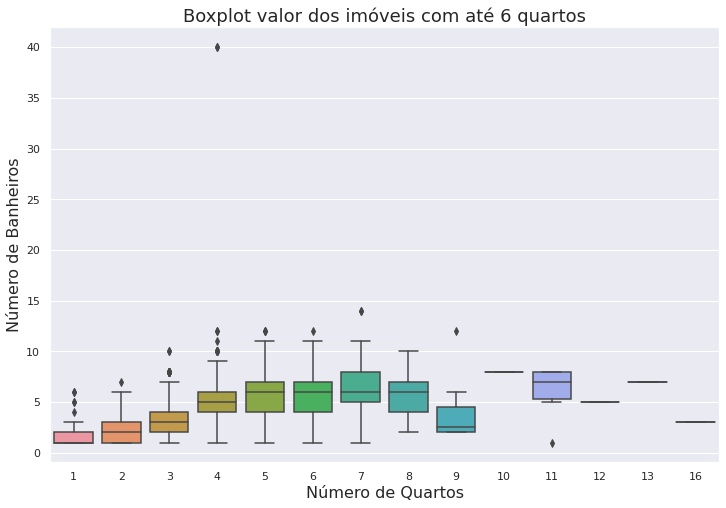

In [52]:
plt.figure(figsize=(12, 8))
ax = sns.boxplot(x="Quartos", y="Banheiros", data=dados_vendas)
ax.set_title("Boxplot valor dos imóveis com até 6 quartos",fontsize=18)
ax.set_xlabel("Número de Quartos",fontsize=16)
ax.set_ylabel("Número de Banheiros",fontsize=16)
plt.show()

### Testes

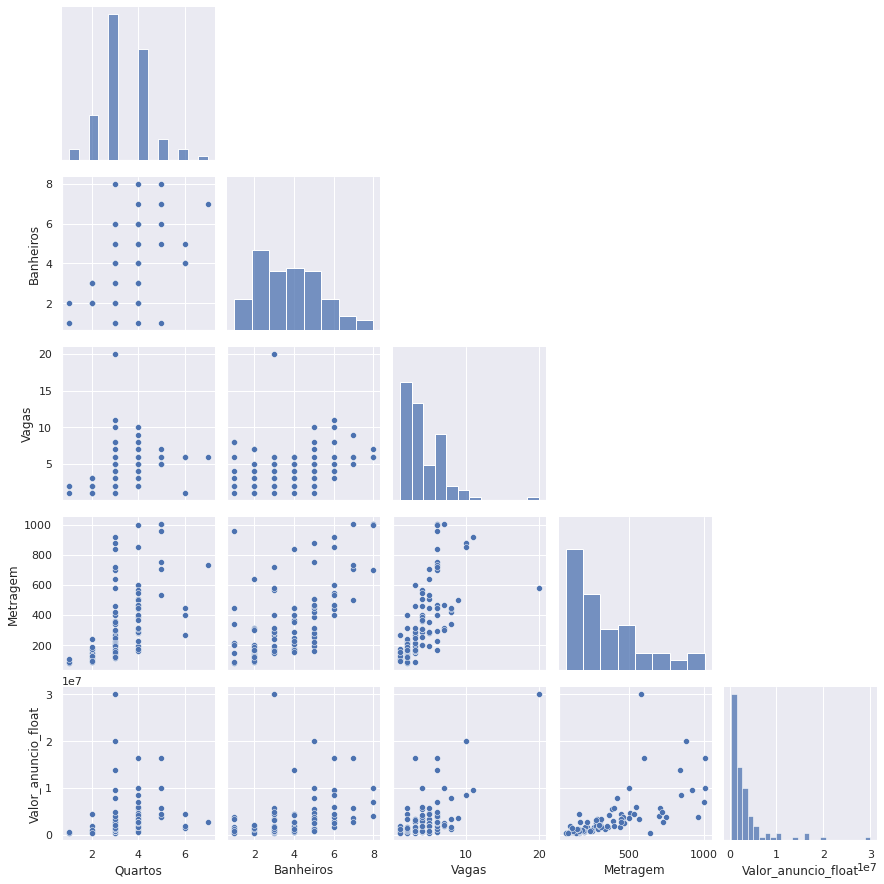

In [53]:
sns.pairplot(dados_vendas[['Quartos', 'Banheiros','Vagas','Metragem', "Valor_anuncio_float"]].sample(100), corner=True)
plt.show()

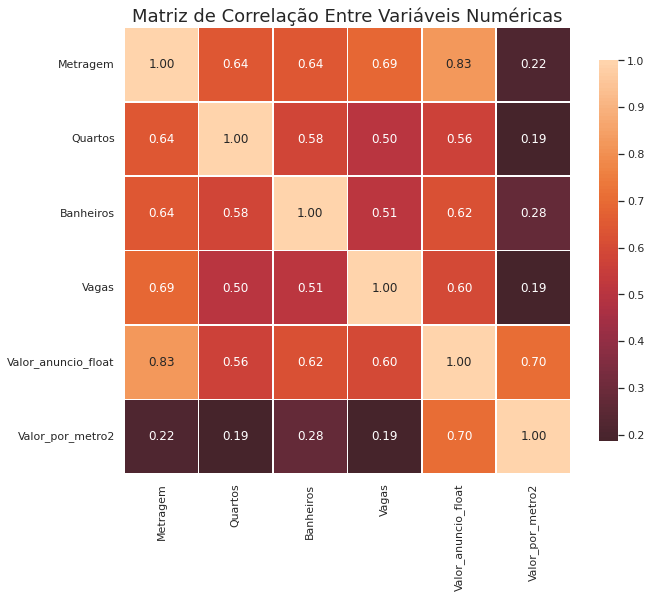

In [54]:
correlations = dados_vendas.corr(method='spearman')
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
ax.set_title("Matriz de Correlação Entre Variáveis Numéricas",fontsize=18)
plt.show();

# Aula 3

In [55]:
dados_vendas["Valor_m2"] = dados_vendas["Valor_anuncio_float"]/dados_vendas["Metragem"]
dados_vendas.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio,Valor_anuncio_float,Valor_por_metro2,Valor_m2
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None,7000000.00,7000.00,7000.00
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None,3700000.00,7459.68,7459.68
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None,380000.00,3040.00,3040.00


In [56]:
dados_vendas.groupby("Bairro").mean().head(3)

,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float,Valor_por_metro2,Valor_m2
Bairro,,,,,,,
Aclimação,246.16,3.27,3.04,2.91,1763200.01,7656.17,7656.17
Alto da Boa Vista,418.88,4.12,5.12,4.62,2391250.00,5849.57,5849.57
Alto da Lapa,299.25,3.15,3.85,4.00,2083168.75,7606.73,7606.73


In [57]:
dados_bairro = dados_vendas.groupby("Bairro").sum()
dados_bairro.head(3)

,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float,Valor_por_metro2,Valor_m2
Bairro,,,,,,,
Aclimação,19447,258,240,230,139292801.00,604837.39,604837.39
Alto da Boa Vista,3351,33,41,37,19130000.00,46796.55,46796.55
Alto da Lapa,23940,252,308,320,166653500.00,608538.25,608538.25


In [58]:
dados_bairro["Valor_m2_bairro"] = dados_bairro["Valor_anuncio_float"]/dados_bairro["Metragem"]
dados_bairro.head(3)

,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float,Valor_por_metro2,Valor_m2,Valor_m2_bairro
Bairro,,,,,,,,
Aclimação,19447,258,240,230,139292801.00,604837.39,604837.39,7162.69
Alto da Boa Vista,3351,33,41,37,19130000.00,46796.55,46796.55,5708.74
Alto da Lapa,23940,252,308,320,166653500.00,608538.25,608538.25,6961.30


In [59]:
dados_vendas.groupby("Bairro").mean().loc["Vila Mariana"]

Metragem                  231.24
Quartos                     3.39
Banheiros                   3.24
Vagas                       2.95
Valor_anuncio_float   1771159.76
Valor_por_metro2         7913.15
Valor_m2                 7913.15
Name: Vila Mariana, dtype: float64

In [60]:
dados_bairro.loc["Vila Mariana"]

Metragem                  39079.00
Quartos                     573.00
Banheiros                   547.00
Vagas                       499.00
Valor_anuncio_float   299326000.00
Valor_por_metro2        1337323.16
Valor_m2                1337323.16
Valor_m2_bairro            7659.51
Name: Vila Mariana, dtype: float64

In [61]:
dados_bairro["Valor_m2_bairro"]["Vila Mariana"]

7659.510222881855

In [62]:
top_bairros = dados_vendas["Bairro"].value_counts()[:10].index
top_bairros

Index(['Alto de Pinheiros', 'Jardim Guedala', 'Jardim Paulista',
       'Brooklin Paulista', 'Jardim Europa', 'Pacaembu', 'Vila Madalena',
       'Cidade Jardim', 'Planalto Paulista', 'Jardim Leonor'],
      dtype='object')

In [63]:
dados_bairro.reset_index(inplace = True)
dados_bairro.head(3)

,Bairro,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float,Valor_por_metro2,Valor_m2,Valor_m2_bairro
0,Aclimação,19447,258,240,230,139292801.00,604837.39,604837.39,7162.69
1,Alto da Boa Vista,3351,33,41,37,19130000.00,46796.55,46796.55,5708.74
2,Alto da Lapa,23940,252,308,320,166653500.00,608538.25,608538.25,6961.30


In [64]:
dados_bairro.query("Bairro in @top_bairros").head(3)

,Bairro,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio_float,Valor_por_metro2,Valor_m2,Valor_m2_bairro
4,Alto de Pinheiros,158616,1453,1782,1827,1764815915.00,4158622.61,4158622.61,11126.34
19,Brooklin Paulista,70002,778,862,832,475796789.00,1627341.87,1627341.87,6796.90
57,Cidade Jardim,132220,789,1008,1172,1164210900.00,1635692.98,1635692.98,8805.10


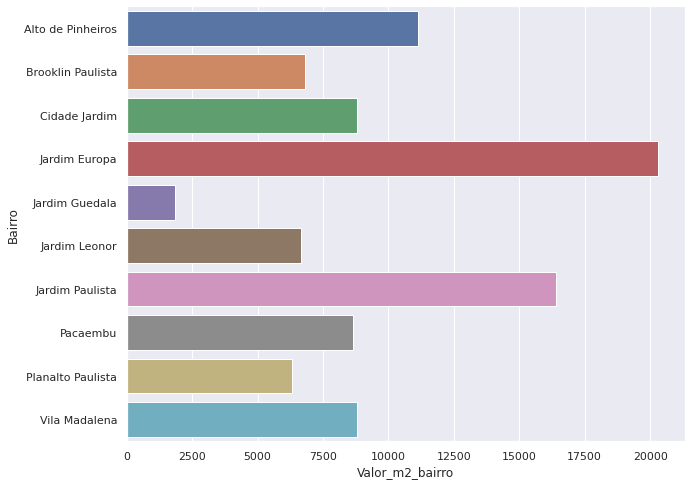

In [65]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(y="Bairro", x="Valor_m2_bairro", data=dados_bairro.query("Bairro in @top_bairros"))
ax.tick_params(axis='x', rotation=0)

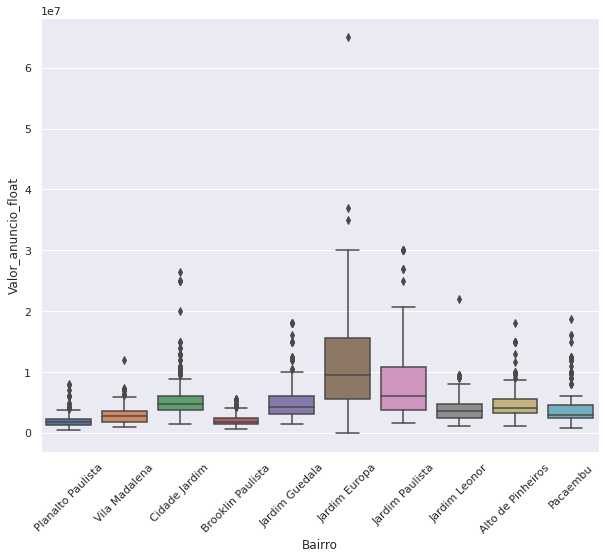

In [66]:
plt.figure(figsize=(10, 8))
ax = sns.boxplot(data = dados_vendas.query("Bairro in @top_bairros"), x="Bairro", y="Valor_anuncio_float")
ax.tick_params(axis='x', rotation=45)
plt.show()

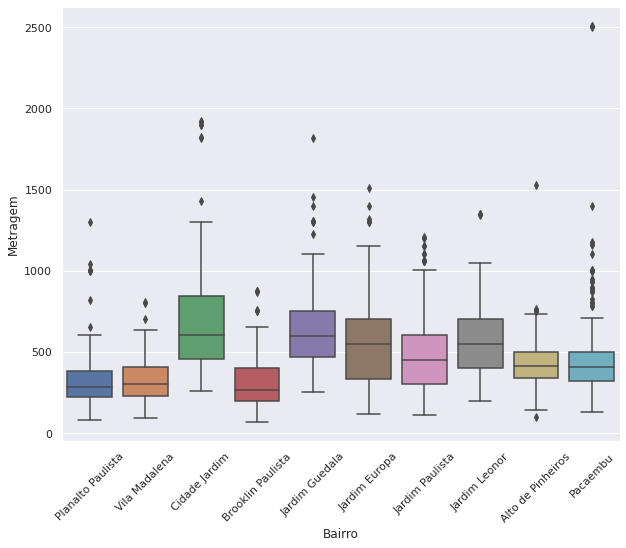

In [67]:
plt.figure(figsize=(10, 8))
ax = sns.boxplot(data = dados_vendas.query("Bairro in @top_bairros & Metragem < 30000"), x="Bairro", y="Metragem")
ax.tick_params(axis='x', rotation=45)
plt.show()

In [68]:
ibge_url = "https://gist.githubusercontent.com/tgcsantos/85f8c7b0a2edbc3e27fcad619b37d886/raw/a4954781e6bca9cb804062a3eea0b3b84679daf4/Basico_SP1.csv"
pd.read_csv(ibge_url,delimiter=';').head(3)

,Cod_setor,Cod_Grandes Regi�es,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V004,V005,V006,V007,V008,V009,V010,V011,V012,Unnamed: 33
0,355030801000001,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,32","2091,32","8532451,78","2164,55","8673276,78","1227,41","4285771,99","1713,75","5152087,86",NaN
1,355030801000002,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,09","1650,09","3983441,31","1717,44","4030519,99","1045,78","2572133,32","1468,08","2991546,94",NaN
2,355030801000003,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"3,08","1280,43","5474593,06","2349,53","7553913,02","902,97","2735492,52","1786,79","3837674,74",NaN


## Desafios

1.  Tentar vincular dados do IBGE com os dados de imóveis.
2.  Tratar os outliers e comparar com os resultados.
3.  Agrupar por mais de uma categoria e realizar as análises.
4.  Organize o colab para deixar com cara de projeto.


### Desafio 1

Tentar vincular dados do IBGE com os dados de imóveis.

In [69]:
ibge_url = "https://gist.githubusercontent.com/tgcsantos/85f8c7b0a2edbc3e27fcad619b37d886/raw/a4954781e6bca9cb804062a3eea0b3b84679daf4/Basico_SP1.csv"
pd.read_csv(ibge_url,delimiter=';')

,Cod_setor,Cod_Grandes Regi�es,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V004,V005,V006,V007,V008,V009,V010,V011,V012,Unnamed: 33
0,355030801000001,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,32","2091,32","8532451,78","2164,55","8673276,78","1227,41","4285771,99","1713,75","5152087,86",NaN
1,355030801000002,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,09","1650,09","3983441,31","1717,44","4030519,99","1045,78","2572133,32","1468,08","2991546,94",NaN
2,355030801000003,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"3,08","1280,43","5474593,06","2349,53","7553913,02","902,97","2735492,52","1786,79","3837674,74",NaN
3,355030801000004,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,26","1119,59","3572955,1","1859,13","4567289,5","869,09","2122409,02","1567,41","2735383,24",NaN
4,355030801000005,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,35","1416,9","2240207,58","1581,66","2240109,39","917,71","1570047,75","1356,35","1725877,85",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,355030896000243,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,61","772,09","168751,1","814,52","143188,21","467,46","191332,48","699,95","123399,08",NaN
18359,355030896000244,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,49","692,5","239941,27","812,93","182516,2","439,33","194034,99","702,1","124952,38",NaN
18360,355030896000245,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"2,54","630,06","329705,22","843,31","260395,9","347,6","228162,66","767,5","181129,99",NaN
18361,355030896000246,3,Regi�o Sudeste,35,S�o Paulo,3515,Metropolitana de S�o Paulo,35061,S�o Paulo,20,...,"4,21","597,37",349101,908,"244391,67","397,76","436942,16","854,2","550319,43",NaN


### Desafio 2

Tratar os outliers e comparar com os resultados.

#### Tratamento Outliers

In [70]:
#Determinação de outliers
def intervalo_outliers(df, variavel):
    #Definicao de quartis e intervalos
    q1 = df[variavel].quantile(0.25)
    q3 = df[variavel].quantile(0.75)
    iqr = q3-q1
    inner_fence = 1.5*iqr
    outer_fence = 3*iqr
    
    #inner fence lower and upper end
    inner_fence_le = q1-inner_fence
    inner_fence_ue = q3+inner_fence
    
    #outer fence lower and upper end
    outer_fence_le = q1-outer_fence
    outer_fence_ue = q3+outer_fence
    #print("Valores abaixo de " + str(outlier_menor) + " e acima de " + str(outlier_maior) + " podem ser considerados outliers para a variável "+ "'" + variavel + "'")
    return outer_fence_le, outer_fence_ue

In [71]:
metragem_menor, metragem_maior = intervalo_outliers(dados_vendas, "Metragem")
quartos_menor, quartos_maior = intervalo_outliers(dados_vendas, "Quartos")
banheiros_menor, banheiros_maior = intervalo_outliers(dados_vendas, "Banheiros")
vagas_menor, vagas_maior = intervalo_outliers(dados_vendas, "Vagas")

In [72]:
outlier_metragem = (dados_vendas.Metragem >= metragem_menor) & (dados_vendas.Metragem <= metragem_maior)
outlier_quartos = (dados_vendas.Quartos >= quartos_menor) & (dados_vendas.Quartos <= quartos_maior)
outlier_banheiros = (dados_vendas.Banheiros >= banheiros_menor) & (dados_vendas.Banheiros <= banheiros_maior)
outlier_vagas = (dados_vendas.Vagas >= vagas_menor) & (dados_vendas.Vagas <= vagas_maior)
teste = dados_vendas[(outlier_metragem) & (outlier_quartos) & (outlier_banheiros) & (outlier_vagas)]

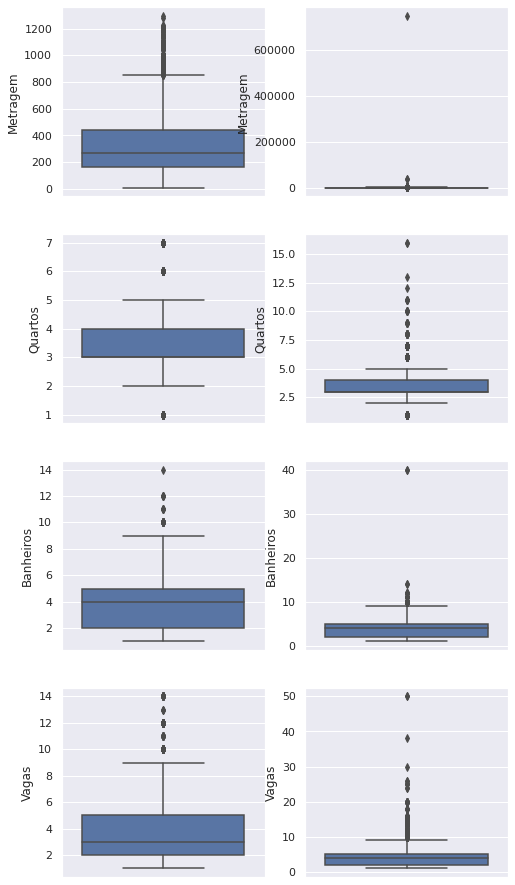

In [73]:
fig, axes = plt.subplots(4, 2, figsize=(8, 16))
ax = sns.boxplot(data = teste, y="Metragem", ax=axes[0][0])
ax = sns.boxplot(data = teste, y="Quartos", ax=axes[1][0])
ax = sns.boxplot(data = teste, y="Banheiros", ax=axes[2][0])
ax = sns.boxplot(data = teste, y="Vagas", ax=axes[3][0])
ax = sns.boxplot(data = dados_vendas, y="Metragem", ax=axes[0][1])
ax = sns.boxplot(data = dados_vendas, y="Quartos", ax=axes[1][1])
ax = sns.boxplot(data = dados_vendas, y="Banheiros", ax=axes[2][1])
ax = sns.boxplot(data = dados_vendas, y="Vagas", ax=axes[3][1])
plt.show()

### Desafio 3

Agrupar por mais de uma categoria e realizar as análises.

In [74]:
dados_vendas[dados_vendas["Bairro"] == "Jardim Europa"].groupby(['Bairro','Quartos','Banheiros']).mean()

Metragem  Vagas  Valor_anuncio_float  \
Bairro        Quartos Banheiros                                         
Jardim Europa 1       1            128.50   2.00           2500000.00   
              2       3            202.20   2.40           5040000.00   
              3       1            450.00   3.40           7900000.00   
                      2            268.25   2.25           5512500.00   
                      3            332.12   3.31           6450812.50   
                      4            449.65   2.88           6117647.06   
                      5            572.47   4.95          12294526.32   
                      6            627.50   3.75          11025000.00   
                      7            881.62   9.50          20625000.00   
              4       2            536.00   6.56           8477777.78   
                      3            335.46   3.77           8175384.62   
                      4            601.85   5.00          12045769.23   
                      5            532.68   5.36          11226000.00   
                      6            579.25   5.08          12493250.00   
                      7            836.00   6.50          14990000.00   
                      8            755.43   6.00          19416571.43   
                      9            780.00   8.00          11900000.00   
                      10           707.00   6.00           8500000.00   
              5       2            400.00   4.00           8790000.00   
                      4            647.00   5.33          18366666.67   
                      5            887.20   7.80          22580000.00   
                      6            592.40   4.80          12659800.00   
                      7            786.25   5.75          18298750.00   
                      8           1025.00   9.00          18450000.00   
                      10           720.00   8.00          13499900.00   
              6       6            875.00   9.00          14450000.00   
                      7            880.00  10.00          15000000.00   
                      8            722.00   4.00           8500000.00   
                      10          1152.50   8.00          15000000.00   
              7       7            600.00   6.00          10600000.00   

                                 Valor_por_metro2  Valor_m2  
Bairro        Quartos Banheiros                              
Jardim Europa 1       1                  19462.62  19462.62  
              2       3                  24957.74  24957.74  
              3       1                  16830.02  16830.02  
                      2                  20601.65  20601.65  
                      3                  17684.48  17684.48  
                      4                  13590.84  13590.84  
                      5                  20456.34  20456.34  
                      6                  17454.53  17454.53  
                      7                  23223.23  23223.23  
              4       2                  16090.33  16090.33  
                      3                  23295.82  23295.82  
                      4                  20334.71  20334.71  
                      5                  21561.60  21561.60  
                      6                  21155.48  21155.48  
                      7                  17808.60  17808.60  
                      8                  25849.67  25849.67  
                      9                  15256.41  15256.41  
                      10                 12022.63  12022.63  
              5       2                  21975.00  21975.00  
                      4                  26437.54  26437.54  
                      5                  21604.96  21604.96  
                      6                  20815.89  20815.89  
                      7                  23571.53  23571.53  
                      8                  19269.23  19269.23  
                      10                 18749.86  18749.86  
              6       

In [75]:
teste[teste["Bairro"] == "Jardim Europa"].groupby(['Bairro','Quartos','Banheiros']).mean()

Metragem  Vagas  Valor_anuncio_float  \
Bairro        Quartos Banheiros                                         
Jardim Europa 1       1            128.50   2.00           2500000.00   
              2       3            202.20   2.40           5040000.00   
              3       1            450.00   3.40           7900000.00   
                      2            268.25   2.25           5512500.00   
                      3            332.12   3.31           6450812.50   
                      4            449.65   2.88           6117647.06   
                      5            572.47   4.95          12294526.32   
                      6            627.50   3.75          11025000.00   
                      7            881.62   9.50          20625000.00   
              4       2            536.00   6.56           8477777.78   
                      3            335.46   3.77           8175384.62   
                      4            601.85   5.00          12045769.23   
                      5            500.00   5.29          10652083.33   
                      6            579.25   5.08          12493250.00   
                      7            836.00   6.50          14990000.00   
                      8            648.00   6.00          16819333.33   
                      9            780.00   8.00          11900000.00   
                      10           707.00   6.00           8500000.00   
              5       2            400.00   4.00           8790000.00   
                      4            647.00   5.33          18366666.67   
                      5            731.50   4.75          11975000.00   
                      6            592.40   4.80          12659800.00   
                      7            613.83   4.33          15731666.67   
                      8            750.00   8.00          18000000.00   
                      10           720.00   8.00          13499900.00   
              6       6            875.00   9.00          14450000.00   
                      7            880.00  10.00          15000000.00   
                      8            722.00   4.00           8500000.00   
                      10          1152.50   8.00          15000000.00   
              7       7            600.00   6.00          10600000.00   

                                 Valor_por_metro2  Valor_m2  
Bairro        Quartos Banheiros                              
Jardim Europa 1       1                  19462.62  19462.62  
              2       3                  24957.74  24957.74  
              3       1                  16830.02  16830.02  
                      2                  20601.65  20601.65  
                      3                  17684.48  17684.48  
                      4                  13590.84  13590.84  
                      5                  20456.34  20456.34  
                      6                  17454.53  17454.53  
                      7                  23223.23  23223.23  
              4       2                  16090.33  16090.33  
                      3                  23295.82  23295.82  
                      4                  20334.71  20334.71  
                      5                  21669.06  21669.06  
                      6                  21155.48  21155.48  
                      7                  17808.60  17808.60  
                      8                  25991.28  25991.28  
                      9                  15256.41  15256.41  
                      10                 12022.63  12022.63  
              5       2                  21975.00  21975.00  
                      4                  26437.54  26437.54  
                      5                  16244.61  16244.61  
                      6                  20815.89  20815.89  
                      7                  24779.92  24779.92  
                      8                  24000.00  24000.00  
                      10                 18749.86  18749.86  
              6       

# Teste ML

In [76]:
teste

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio,Valor_anuncio_float,Valor_por_metro2,Valor_m2
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None,7000000.00,7000.00,7000.00
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None,3700000.00,7459.68,7459.68
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None,380000.00,3040.00,3040.00
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,R$ 685.000,R$,685.000,None,685000.00,2209.68,2209.68
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,R$ 540.000,R$,540.000,None,540000.00,5400.00,5400.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10001,Rua Pedro Teixeira,Vila Olímpia,São Paulo,157,3,2,2,R$ 960.000,R$,960.000,None,960000.00,6114.65,6114.65
10002,Avenida Odila,Planalto Paulista,São Paulo,267,3,6,4,R$ 1.500.000,R$,1.500.000,None,1500000.00,5617.98,5617.98
10003,Rua Tapuçu,Vila Sofia,São Paulo,95,2,2,2,R$ 665.000,R$,665.000,None,665000.00,7000.00,7000.00
10005,Rua Estero Belaco,Vila da Saúde,São Paulo,205,3,3,6,R$ 1.050.000,R$,1.050.000,None,1050000.00,5121.95,5121.95


In [77]:
import scipy.stats as stats
import sklearn
from sklearn.svm import SVR
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [78]:
#x_cat = pd.get_dummies(teste['Bairro'])
train = teste[['Metragem','Quartos','Banheiros','Vagas','Valor_anuncio_float']]
x_num = teste[['Metragem','Quartos','Banheiros','Vagas']]
#x = pd.concat([x_num,x_cat], axis = 1)
x = x_num
y = teste['Valor_anuncio_float']

In [79]:
print("Find most important features relative to target")
corr = train.corr()
corr.sort_values(["Valor_anuncio_float"], ascending = False, inplace = True)
print(corr.Valor_anuncio_float)

Find most important features relative to target
Valor_anuncio_float   1.00
Metragem              0.71
Vagas                 0.46
Banheiros             0.45
Quartos               0.36
Name: Valor_anuncio_float, dtype: float64


## Divisão entre dados de treino e dados de teste

In [80]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)
print("X_train : " + str(X_train.shape))
print("X_test : " + str(X_test.shape))
print("y_train : " + str(y_train.shape))
print("y_test : " + str(y_test.shape))

X_train : (6299, 4)
X_test : (2700, 4)
y_train : (6299,)
y_test : (2700,)


In [81]:
import numpy as np
from sklearn.linear_model import LinearRegression
model = LinearRegression().fit(X_train, y_train)

In [82]:
r_sq = model.score(X_test, y_test)
r_sq

0.5173111972172942

In [83]:
from sklearn.preprocessing import PolynomialFeatures

In [84]:
x_ = PolynomialFeatures(degree=2, include_bias=False).fit_transform(X_train)

In [85]:
model = LinearRegression().fit(x_, y_train)

In [86]:
r_sq = model.score(x_, y_train)
r_sq

0.5078029313608083

In [87]:
import numpy as np
import statsmodels.api as sm


In [88]:
x = sm.add_constant(X_train)

In [89]:
model = sm.OLS(y_train, x)

In [90]:
results = model.fit()

In [91]:
print(results.summary())

                             OLS Regression Results                            
Dep. Variable:     Valor_anuncio_float   R-squared:                       0.497
Model:                             OLS   Adj. R-squared:                  0.497
Method:                  Least Squares   F-statistic:                     1555.
Date:                 Fri, 27 May 2022   Prob (F-statistic):               0.00
Time:                         15:07:39   Log-Likelihood:            -1.0186e+05
No. Observations:                 6299   AIC:                         2.037e+05
Df Residuals:                     6294   BIC:                         2.038e+05
Df Model:                            4                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -5.967e+05   1.22e+05     -4.87

In [92]:
>>> from sklearn.ensemble import RandomForestRegressor
>>> from sklearn.datasets import make_regression

In [93]:
x = teste[['Metragem','Quartos','Banheiros','Vagas']]
y = teste['Valor_anuncio_float']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

In [94]:
rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)
score = rfr.score(X_test, y_test)
print("R-squared:", score) 

R-squared: 0.559533904981043


In [95]:
y_pred = rfr.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse*(1/2.0)) 

MSE:  5602605716322.673
RMSE:  2801302858161.3364


In [96]:
from sklearn.preprocessing import scale
x = scale(x)
y = scale(y)
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.15, random_state=420)

rfr = RandomForestRegressor(n_estimators=100)
rfr.fit(xtrain, ytrain)

score = rfr.score(xtrain, ytrain)
print("R-squared:", score)

ypred = rfr.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE: ", mse)
print("RMSE: ", mse*(1/2.0))

R-squared: 0.9112568542705289
MSE:  0.36521226480663893
RMSE:  0.18260613240331947


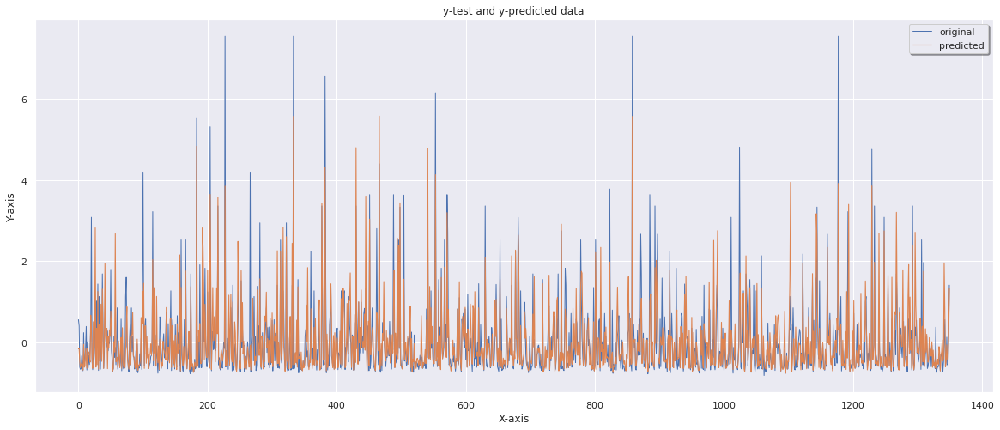

In [97]:
plt.figure(figsize=(20, 8))
x_ax = range(len(ytest))
plt.plot(x_ax, ytest, linewidth=1, label="original")
plt.plot(x_ax, ypred, linewidth=1.1, label="predicted")
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

# Aula 4

In [98]:
ibge_sp = pd.read_csv('https://raw.githubusercontent.com/Matheuslanna/Imersao_Dados_Alura/main/Dados/Basico_SP1.csv',           
                      sep=';', thousands='.', decimal=',')
ibge_sp.dropna(how='all', axis=1, inplace=True)
ibge_sp.head()

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,355030801000001,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.01,2.32,2091.32,8532451.78,2164.55,8673276.78,1227.41,4285771.99,1713.75,5152087.86
1,355030801000002,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,2.98,2.09,1650.09,3983441.31,1717.44,4030519.99,1045.78,2572133.32,1468.08,2991546.94
2,355030801000003,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.31,3.08,1280.43,5474593.06,2349.53,7553913.02,902.97,2735492.52,1786.79,3837674.74
3,355030801000004,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.16,2.26,1119.59,3572955.10,1859.13,4567289.50,869.09,2122409.02,1567.41,2735383.24
4,355030801000005,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.14,2.35,1416.90,2240207.58,1581.66,2240109.39,917.71,1570047.75,1356.35,1725877.85


In [99]:
ibge_sp.columns

Index(['Cod_setor', 'Cod_Grandes Regiões', 'Nome_Grande_Regiao', 'Cod_UF',
       'Nome_da_UF ', 'Cod_meso', 'Nome_da_meso', 'Cod_micro', 'Nome_da_micro',
       'Cod_RM', 'Nome_da_RM', 'Cod_municipio', 'Nome_do_municipio',
       'Cod_distrito', 'Nome_do_distrito', 'Cod_subdistrito',
       'Nome_do_subdistrito', 'Cod_bairro', 'Nome_do_bairro', 'Situacao_setor',
       'Tipo_setor', 'V001', 'V002', 'V003', 'V004', 'V005', 'V006', 'V007',
       'V008', 'V009', 'V010', 'V011', 'V012'],
      dtype='object')

In [100]:
ibge_sp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18363 entries, 0 to 18362
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Cod_setor            18363 non-null  int64  
 1   Cod_Grandes Regiões  18363 non-null  int64  
 2   Nome_Grande_Regiao   18363 non-null  object 
 3   Cod_UF               18363 non-null  int64  
 4   Nome_da_UF           18363 non-null  object 
 5   Cod_meso             18363 non-null  int64  
 6   Nome_da_meso         18363 non-null  object 
 7   Cod_micro            18363 non-null  int64  
 8   Nome_da_micro        18363 non-null  object 
 9   Cod_RM               18363 non-null  int64  
 10  Nome_da_RM           18363 non-null  object 
 11  Cod_municipio        18363 non-null  int64  
 12  Nome_do_municipio    18363 non-null  object 
 13  Cod_distrito         18363 non-null  int64  
 14  Nome_do_distrito     18363 non-null  object 
 15  Cod_subdistrito      18363 non-null 

In [101]:
enderecos = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Imersao Dados/enderecos.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [102]:
enderecos.head(3)

,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude
0,Rua,Armando Silveira,Rua Armando Silveira,NaN,Divisa,Santana do Livramento,RS,97573200.00,-30.88,-55.55
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.00,-21.19,-50.45
2,Rua,Prefeito Agenor Barcelos Feio,Rua Prefeito Agenor Barcelos Feio,NaN,Registro,Santana do Livramento,RS,97571090.00,-30.86,-55.56


In [103]:
enderecos_sp = enderecos.query("sigla_uf == 'SP'")
enderecos_sp.head(3)

,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.00,-21.19,-50.45
413269,Rua,A,Rua A,NaN,Jardim Glória,Americana,SP,13468220.00,-22.76,-47.34
413270,Rua,A,Rua A,NaN,Jardim São Roque,Americana,SP,13469414.00,-22.74,-47.35


In [104]:
enderecos_sp["rua"] = enderecos_sp["tipo_logr"] + " " + enderecos_sp["logr_nome"]
enderecos_sp["rua"] = enderecos_sp["rua"].str.lower().str.strip()
enderecos_sp.head(3)

,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude,rua
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.00,-21.19,-50.45,rua joão antônio vasconcelos
413269,Rua,A,Rua A,NaN,Jardim Glória,Americana,SP,13468220.00,-22.76,-47.34,rua a
413270,Rua,A,Rua A,NaN,Jardim São Roque,Americana,SP,13469414.00,-22.74,-47.35,rua a


In [105]:
dados_vendas["apenas_rua"] = dados_vendas["Rua"].str.extract(r'(^[\w ]+)')
dados_vendas["apenas_rua"] = dados_vendas["apenas_rua"].str.lower().str.strip()
dados_vendas.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio,Valor_anuncio_float,Valor_por_metro2,Valor_m2,apenas_rua
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None,7000000.00,7000.00,7000.00,avenida itacira
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None,3700000.00,7459.68,7459.68,rua aurelia perez alvarez
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None,380000.00,3040.00,3040.00,rua alba valdez


In [106]:
dados_geo = pd.merge(left = dados_vendas, right = enderecos_sp[["rua", "cep", "latitude", "longitude"]], how = "left", left_on = "apenas_rua", right_on = "rua").drop_duplicates(subset=dados_vendas.columns).query("cep > 0")
dados_geo.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,Tipo_anuncio,Valor_anuncio_float,Valor_por_metro2,Valor_m2,apenas_rua,rua,cep,latitude,longitude
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None,7000000.00,7000.00,7000.00,avenida itacira,avenida itacira,11443160.00,-23.98,-46.20
5,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None,3700000.00,7459.68,7459.68,rua aurelia perez alvarez,rua aurelia perez alvarez,4642020.00,-23.64,-46.69
6,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None,380000.00,3040.00,3040.00,rua alba valdez,rua alba valdez,4845200.00,-23.75,-46.70


In [107]:
ibge_sp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18363 entries, 0 to 18362
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Cod_setor            18363 non-null  int64  
 1   Cod_Grandes Regiões  18363 non-null  int64  
 2   Nome_Grande_Regiao   18363 non-null  object 
 3   Cod_UF               18363 non-null  int64  
 4   Nome_da_UF           18363 non-null  object 
 5   Cod_meso             18363 non-null  int64  
 6   Nome_da_meso         18363 non-null  object 
 7   Cod_micro            18363 non-null  int64  
 8   Nome_da_micro        18363 non-null  object 
 9   Cod_RM               18363 non-null  int64  
 10  Nome_da_RM           18363 non-null  object 
 11  Cod_municipio        18363 non-null  int64  
 12  Nome_do_municipio    18363 non-null  object 
 13  Cod_distrito         18363 non-null  int64  
 14  Nome_do_distrito     18363 non-null  object 
 15  Cod_subdistrito      18363 non-null 

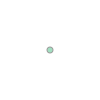

In [108]:
latitude = -23.56 	
longitude = -46.59
Point(longitude, latitude)

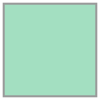

In [109]:
Polygon([[0, 0], [1, 0], [1, 1], [0, 1], [0, 0]])

In [110]:
Polygon([[0, 0], [1, 0], [1, 1], [0, 1], [0, 0]]).contains(Point(0.1,0.9))

True

In [111]:
setor_censo = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/Imersao Dados/35SEE250GC_SIR.shp')
setor_censo.head(3)

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry
0,98237.00,354100005000009,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,1,"POLYGON ((-46.41024 -24.01103, -46.41169 -24.0..."
1,98232.00,354100005000004,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,2,"POLYGON ((-46.41606 -24.00245, -46.41598 -24.0..."
2,98230.00,354100005000002,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,3,"POLYGON ((-46.41213 -24.00792, -46.41244 -24.0..."


In [112]:
setor_censo_sp = setor_censo[setor_censo.NM_MUNICIP == "SÃO PAULO"]
setor_censo_sp[setor_censo_sp.contains(Point(-46.63, -23.58))]

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry
60986,126568.00,355030890000080,URBANO,35503089000,None,355030890,VILA MARIANA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,60987,"POLYGON ((-46.62618 -23.58169, -46.62863 -23.5..."


In [113]:
dados_geo["Point"] = ""
for i in dados_geo.index:
    dados_geo["Point"][i] = Point(dados_geo["longitude"][i], dados_geo["latitude"][i])

dados_geo['setor_censo'] = dados_geo["Point"][:10].map(
    lambda x: setor_censo_sp.loc[setor_censo_sp.contains(x), 'CD_GEOCODI'].values
).str[0]
dados_geo.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_anuncio,...,Valor_anuncio_float,Valor_por_metro2,Valor_m2,apenas_rua,rua,cep,latitude,longitude,Point,setor_censo
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,...,7000000.00,7000.00,7000.00,avenida itacira,avenida itacira,11443160.00,-23.98,-46.20,POINT (-46.2013172 -23.975993),NaN
5,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,...,3700000.00,7459.68,7459.68,rua aurelia perez alvarez,rua aurelia perez alvarez,4642020.00,-23.64,-46.69,POINT (-46.6883114 -23.6409612),355030871000023
6,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,...,380000.00,3040.00,3040.00,rua alba valdez,rua alba valdez,4845200.00,-23.75,-46.70,POINT (-46.6958895 -23.75299),355030830000050


In [114]:
dados_geo = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Imersao Dados/dados_geo.csv")
dados_geo.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Valor_anuncio,Tipo_anuncio,Valor_mm,Valor_m2,rua,cep,latitude,longitude,Point,setor_censo
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,7000000.00,NaN,7.00,7000.00,Avenida Itacira,4061000.00,-23.62,-46.65,POINT (-46.6481622 -23.6157934),355030877000067.00
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,3700000.00,NaN,3.70,7459.68,Rua Aurelia Perez Alvarez,4642020.00,-23.64,-46.69,POINT (-46.6883114 -23.6409612),355030871000023.00
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,380000.00,NaN,0.38,3040.00,Rua Alba Valdez,4845200.00,-23.75,-46.70,POINT (-46.6958895 -23.75299),355030830000050.00


In [115]:
dados_vendas_censo = pd.merge(left = dados_geo, right = ibge_sp, how = "left", left_on = "setor_censo", right_on = "Cod_setor")
dados_vendas_censo.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Valor_anuncio,Tipo_anuncio,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,7000000.00,NaN,...,2.66,2.04,3158.96,22210644.93,5570.65,25770816.97,2096.19,13029851.56,3930.35,17241576.74
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,3700000.00,NaN,...,3.13,1.96,7600.44,36778930.17,7890.53,35886906.64,4149.00,26760682.90,6063.92,27502674.90
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,380000.00,NaN,...,3.47,3.06,805.13,769188.78,1011.75,757433.42,518.77,426672.78,858.51,414378.88


In [116]:
dados_vendas_censo['setor_censo']

0      355030877000067.00
1      355030871000023.00
2      355030830000050.00
3      355030808000050.00
4      355030865000169.00
              ...        
5600   355030877000099.00
5601   355030816000087.00
5602                  NaN
5603   355030877000052.00
5604   355030893000077.00
Name: setor_censo, Length: 5605, dtype: float64

In [117]:
dados_vendas_censo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5605 entries, 0 to 5604
Data columns (total 51 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Rua                  5605 non-null   object 
 1   Bairro               5597 non-null   object 
 2   Cidade               5605 non-null   object 
 3   Metragem             5605 non-null   int64  
 4   Quartos              5605 non-null   int64  
 5   Banheiros            5605 non-null   int64  
 6   Vagas                5605 non-null   int64  
 7   Valor                5605 non-null   object 
 8   Valor_anuncio        5605 non-null   float64
 9   Tipo_anuncio         0 non-null      float64
 10  Valor_mm             5605 non-null   float64
 11  Valor_m2             5605 non-null   float64
 12  rua                  5605 non-null   object 
 13  cep                  5605 non-null   float64
 14  latitude             5605 non-null   float64
 15  longitude            5605 non-null   f

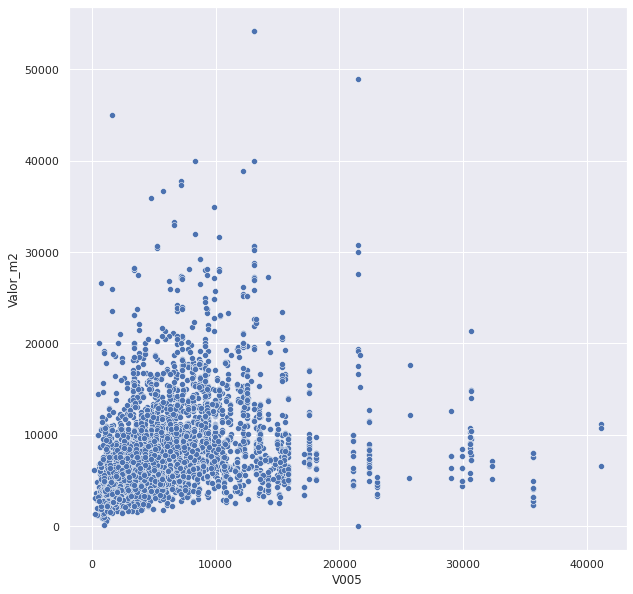

In [118]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data = dados_vendas_censo, x="V005", y="Valor_m2")

##Desafios

1. Realizar uma análise dos dados do IBGE por mapa, analisando a distribuição de renda (https://medium.com/creditas-tech/dados-georreferenciados-explora%C3%A7%C3%A3o-e-visualiza%C3%A7%C3%A3o-com-python-edd51e7c53da)

2. Repassar a aula para entender melhor o que foi realizado

3. Aprofundar a análise entre dados de vendas e renda.

4. Realizar a análise exploratória e encontrar variáveis relevantes para solução do problema. 

### Desafio 1

Realizar uma análise dos dados do IBGE por mapa, analisando a distribuição de renda

In [119]:
setor_censo_sp['CD_GEOCODI'] = setor_censo_sp['CD_GEOCODI'].astype('int64')
#ibge_sp['Cod_setor'] = ibge_sp['Cod_setor'].astype('O')

In [120]:
# center = [-23.55, -46.50]

# # Create the map
# m = folium.Map(location=center, tiles='Stamen Toner', zoom_start=12,max_bounds=True)
# ne = [-23.34, -46.36]
# sw = [-23.77, -46.86]
# m.fit_bounds([sw, ne])

# # Add a choropleth map to the base map
# folium.Choropleth(geo_data = setor_censo_sp.__geo_interface__,
#            data = ibge_sp, 
#            columns = ['Cod_setor', 'V005'],
#            key_on = "feature.properties.CD_GEOCODI", 
#            fill_color = "YlGn", 
#            fill_opacity = 0.8,
#            legend_name = 'Renda Média').add_to(m)
# folium.LayerControl().add_to(m)
# # Display the map
# m.save('mymap.html')

In [121]:
dados_vendas_censo.columns

Index(['Rua', 'Bairro', 'Cidade', 'Metragem', 'Quartos', 'Banheiros', 'Vagas',
       'Valor', 'Valor_anuncio', 'Tipo_anuncio', 'Valor_mm', 'Valor_m2', 'rua',
       'cep', 'latitude', 'longitude', 'Point', 'setor_censo', 'Cod_setor',
       'Cod_Grandes Regiões', 'Nome_Grande_Regiao', 'Cod_UF', 'Nome_da_UF ',
       'Cod_meso', 'Nome_da_meso', 'Cod_micro', 'Nome_da_micro', 'Cod_RM',
       'Nome_da_RM', 'Cod_municipio', 'Nome_do_municipio', 'Cod_distrito',
       'Nome_do_distrito', 'Cod_subdistrito', 'Nome_do_subdistrito',
       'Cod_bairro', 'Nome_do_bairro', 'Situacao_setor', 'Tipo_setor', 'V001',
       'V002', 'V003', 'V004', 'V005', 'V006', 'V007', 'V008', 'V009', 'V010',
       'V011', 'V012'],
      dtype='object')

In [122]:
import branca
import branca.colormap as cm

m2 = folium.Map(location=[-23.60, -46.66], 
                 tiles='Stamen Toner', zoom_start=12)

colormap = cm.LinearColormap(colors=['darkblue', 'blue', 'cyan', 'yellow', 'orange', 'red'], index=[1300,550000,1000000,1600000,2000000,65000000],vmin=1300,vmax=65000000, caption='Valor do Imovel')

for i, imovel in dados_vendas_censo.iterrows():
  folium.CircleMarker(
    location=[imovel.latitude, imovel.longitude],
    radius= imovel.Metragem/50 if (imovel.Metragem/50 < 40) else 40,
    popup="Valor: " + "R${:,.2f}".format(imovel.Valor_anuncio) + "\n Metragem: " + str(imovel.Metragem) + "m²",
    color=colormap(imovel.Valor_anuncio),
    fill=True,
    fill_color=colormap(imovel.Valor_anuncio),
).add_to(m2)

colormap.add_to(m2)

m2

In [123]:
center = [-23.55, -46.50]

# Create the map
m = folium.Map(location=center, tiles='Stamen Toner', zoom_start=12,max_bounds=True)
ne = [-23.34, -46.36]
sw = [-23.77, -46.86]
m.fit_bounds([sw, ne])

# Add a choropleth map to the base map
folium.Choropleth(geo_data = setor_censo_sp.__geo_interface__,
            data = dados_vendas_censo, 
            columns = ['setor_censo','V005'],
            key_on = "feature.properties.Cod_setor", 
            fill_color = "PuRd", 
            fill_opacity = 0.5,
            legend_name = 'Renda Média').add_to(m)
 # Display the map
m.save('mymap2.html')

### Desafio 3

Aprofundar a análise entre dados de vendas e renda.

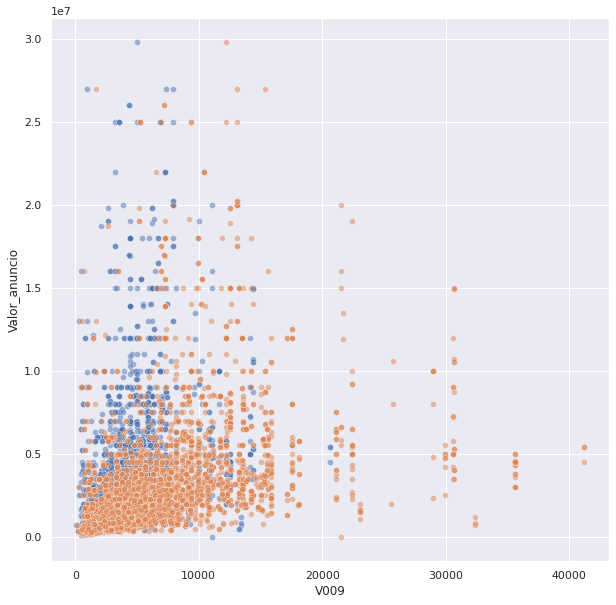

In [124]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data = dados_vendas_censo[dados_vendas_censo['Valor_anuncio'] < 30000000], x="V009", y="Valor_anuncio",alpha =0.5)
sns.scatterplot(data = dados_vendas_censo[dados_vendas_censo['Valor_anuncio'] < 30000000], x="V005", y="Valor_anuncio",alpha =0.5)
plt.show()

### Desafio 4

Realizar a análise exploratória e encontrar variáveis relevantes para solução do problema. 

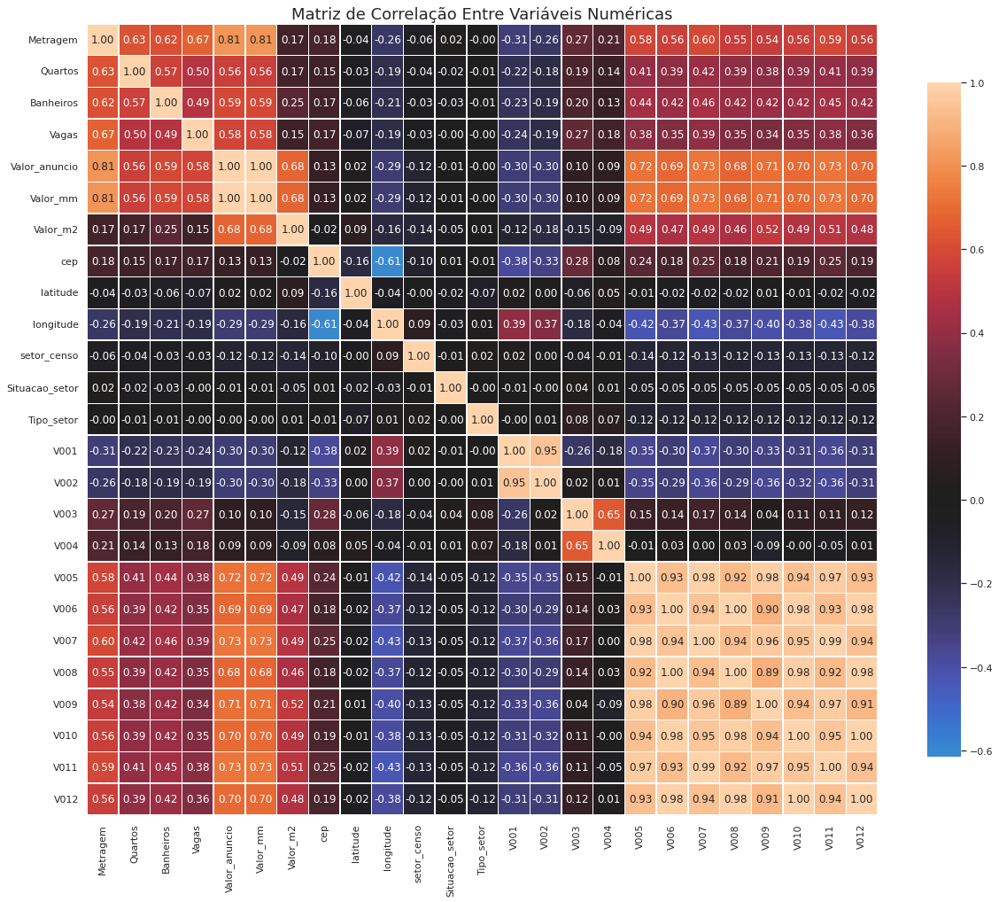

In [125]:
correlations = dados_vendas_censo[['Rua', 'Bairro', 'Cidade', 'Metragem', 
                                   'Quartos', 'Banheiros', 'Vagas','Valor', 
                                   'Valor_anuncio', 'Valor_mm', 'Valor_m2', 
                                   'rua','cep', 'latitude', 'longitude',
                                   'Point', 'setor_censo',
                                   'Nome_do_bairro', 'Situacao_setor',
                                   'Tipo_setor', 'V001','V002', 'V003', 'V004',
                                   'V005', 'V006', 'V007', 'V008', 'V009',
                                   'V010', 'V011', 'V012']].corr(method='spearman')
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
ax.set_title("Matriz de Correlação Entre Variáveis Numéricas",fontsize=18)
plt.show();

In [126]:
teste_outlier = dados_vendas_censo.copy(deep=True)

In [127]:
metragem_menor, metragem_maior = intervalo_outliers(teste_outlier, "Metragem")
quartos_menor, quartos_maior = intervalo_outliers(teste_outlier, "Quartos")
banheiros_menor, banheiros_maior = intervalo_outliers(teste_outlier, "Banheiros")
vagas_menor, vagas_maior = intervalo_outliers(teste_outlier, "Vagas")

In [128]:
outlier_metragem = (teste_outlier.Metragem >= metragem_menor) & (teste_outlier.Metragem <= metragem_maior)
outlier_quartos = (teste_outlier.Quartos >= quartos_menor) & (teste_outlier.Quartos <= quartos_maior)
outlier_banheiros = (teste_outlier.Banheiros >= banheiros_menor) & (teste_outlier.Banheiros <= banheiros_maior)
outlier_vagas = (teste_outlier.Vagas >= vagas_menor) & (teste_outlier.Vagas <= vagas_maior)
teste_outliers = teste_outlier[(outlier_metragem) & (outlier_quartos) & (outlier_banheiros) & (outlier_vagas)]

In [129]:
df_final = teste_outliers[['Metragem', 'Quartos', 'Banheiros', 'Vagas','Valor_anuncio','cep', 'setor_censo','Situacao_setor', 'Tipo_setor','V005','V009']].dropna()
x = df_final[['Metragem', 'Quartos', 'Banheiros', 'Vagas','cep', 'setor_censo','Situacao_setor', 'Tipo_setor','V005','V009']]

y = df_final['Valor_anuncio']

#x = scale(x)
#y = scale(y)
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.10, random_state=420)

rfr = RandomForestRegressor(n_estimators=100)
rfr.fit(xtrain, ytrain)

score = rfr.score(xtrain, ytrain)
print("R-squared:", score)

ypred = rfr.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE: ", mse)
print("RMSE: ", mse*(1/2.0))


R-squared: 0.9746904716250281
MSE:  926103607930.1874
RMSE:  463051803965.0937


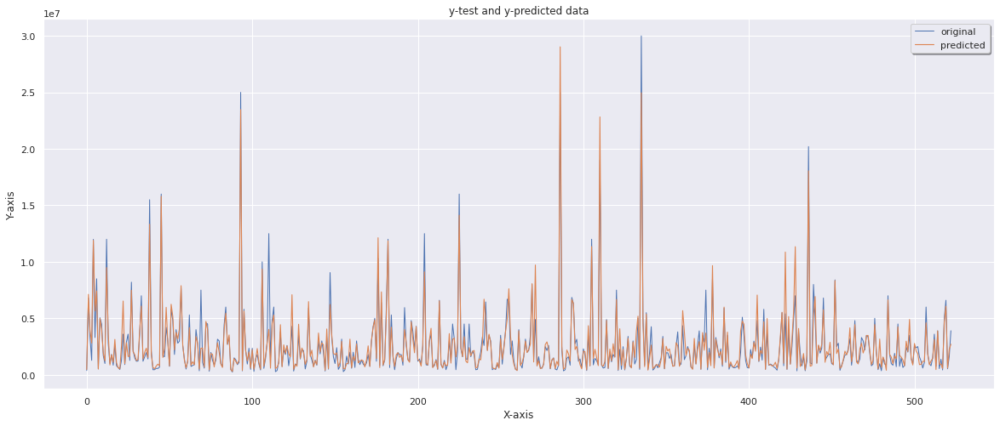

In [130]:
plt.figure(figsize=(20, 8))
x_ax = range(len(ytest))
plt.plot(x_ax, ytest, linewidth=1, label="original")
plt.plot(x_ax, ypred, linewidth=1.1, label="predicted")
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [131]:
forest_importances = pd.Series(rfr.feature_importances_, index=x.columns)
std = np.std([tree.feature_importances_ for tree in rfr.estimators_], axis=0)

<Figure size 576x576 with 0 Axes>

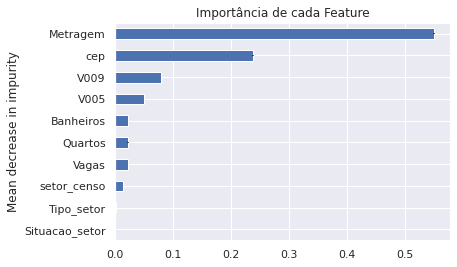

In [132]:
plt.figure(figsize=(8,8))
fig, ax = plt.subplots()
forest_importances.sort_values().plot.barh(yerr=std, ax=ax)
ax.set_title("Importância de cada Feature")
ax.set_ylabel("Mean decrease in impurity")
plt.show()

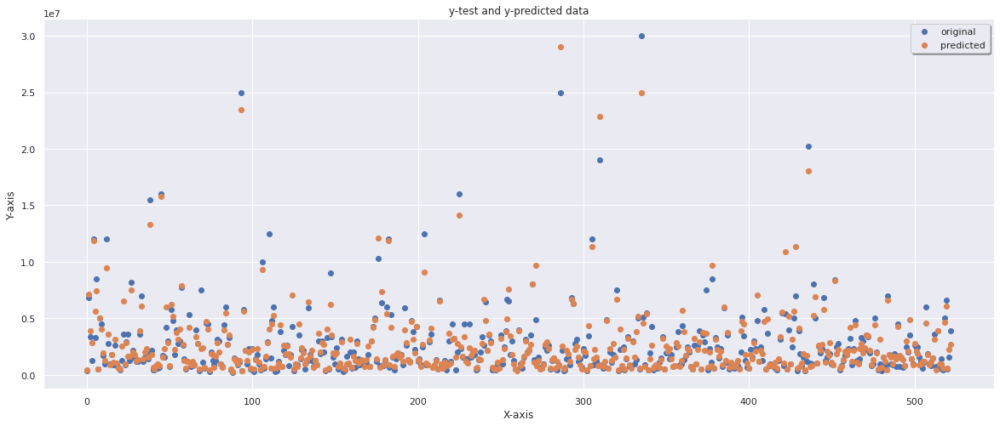

In [133]:
plt.figure(figsize=(20, 8))
x_ax = range(len(ytest))
plt.scatter(x_ax, ytest, linewidth=1, label="original")
plt.scatter(x_ax, ypred, linewidth=1.1, label="predicted")
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

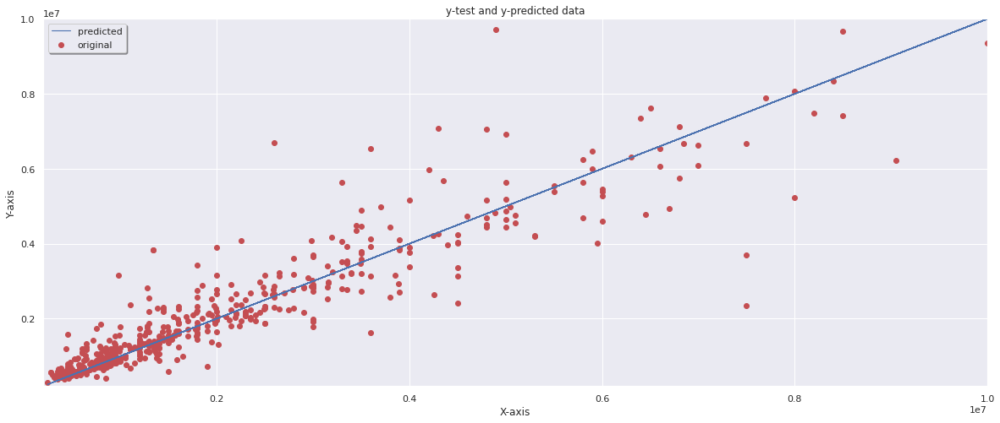

In [134]:
plt.figure(figsize=(20, 8))
plt.scatter(ytest, ypred, linewidth=1, label="original",c='r')
plt.plot(ytest, ytest, linewidth=1.1, label="predicted")
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.xlim([200000, 10000000])
plt.ylim([200000, 10000000])
plt.grid(True)
plt.show() 

# Aula 5

In [135]:
pd.set_option("display.precision", 2)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
sns.set()

dados_vendas_censo = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Imersao Dados/dados_vendas_censo.csv")
dados_vendas_censo = dados_vendas_censo[['Rua', 'Bairro', 'Cidade', 'Metragem', 'Quartos', 'Banheiros', 'Vagas',
       'Valor_anuncio', 'Valor_mm', 'Valor_m2', 'latitude', 'longitude', 'Situacao_setor', 'V001',
       'V002', 'V003', 'V004', 'V005', 'V006', 'V007', 'V008', 'V009', 'V010',
       'V011', 'V012']].dropna()
dados_vendas_censo.head(3)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio,Valor_mm,Valor_m2,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.00,7.00,7000.00,...,2.66,2.04,3158.96,22210644.93,5570.65,25770816.97,2096.19,13029851.56,3930.35,17241576.74
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.00,3.70,7459.68,...,3.13,1.96,7600.44,36778930.17,7890.53,35886906.64,4149.00,26760682.90,6063.92,27502674.90
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.00,0.38,3040.00,...,3.47,3.06,805.13,769188.78,1011.75,757433.42,518.77,426672.78,858.51,414378.88


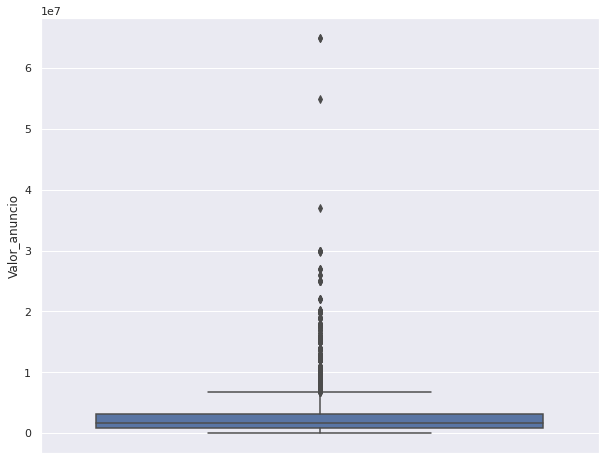

In [136]:
plt.figure(figsize=(10, 8))
ax = sns.boxplot(data = dados_vendas_censo, y="Valor_anuncio")
plt.show()

In [137]:
dados_vendas_censo.query("Valor_anuncio > 30000000 | Valor_anuncio < 100000")

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio,Valor_mm,Valor_m2,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
54,Rua Inglaterra,Jardim Europa,São Paulo,200,3,3,2,13000.00,0.01,65.00,...,3.13,2.87,21545.71,1577883376.43,26081.65,1794039881.36,11050.67,882338714.47,15470.93,1168079134.43
89,Rua Inglaterra,Jardim Europa,São Paulo,756,5,4,10,37000000.00,37.00,48941.80,...,3.13,2.87,21545.71,1577883376.43,26081.65,1794039881.36,11050.67,882338714.47,15470.93,1168079134.43
1032,Praça Nicolau Scarpa,Jardim América,São Paulo,1200,4,4,25,65000000.00,65.00,54166.67,...,3.57,3.01,13131.61,508165993.72,14507.30,541764826.89,7934.91,364776324.15,10168.24,445001716.57
3521,Rua Estados Unidos,Jardim América,São Paulo,1816,4,10,20,55000000.00,55.00,30286.34,...,3.57,3.01,13131.61,508165993.72,14507.30,541764826.89,7934.91,364776324.15,10168.24,445001716.57
3896,Rua Estados Unidos,Jardim América,São Paulo,1200,4,6,24,65000000.00,65.00,54166.67,...,3.57,3.01,13131.61,508165993.72,14507.30,541764826.89,7934.91,364776324.15,10168.24,445001716.57


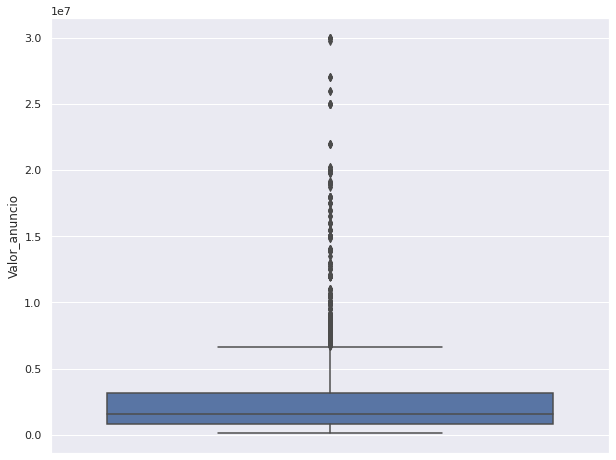

In [138]:
dados_vendas_censo.drop(dados_vendas_censo.query("Valor_anuncio > 30000000 | Valor_anuncio < 100000").index, inplace = True)
plt.figure(figsize=(10, 8))
ax = sns.boxplot(data = dados_vendas_censo, y="Valor_anuncio")
plt.show()

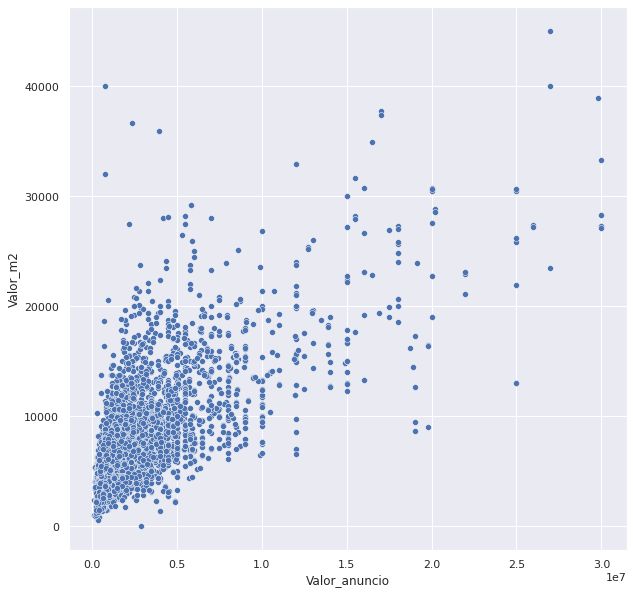

In [139]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data = dados_vendas_censo, x="Valor_anuncio", y="Valor_m2")

In [140]:
dados_vendas_censo.corr()

,Metragem,Quartos,Banheiros,Vagas,Valor_anuncio,Valor_mm,Valor_m2,latitude,longitude,Situacao_setor,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
Metragem,1.00,0.23,0.23,0.27,0.30,0.30,0.06,-0.09,-0.13,0.48,...,0.13,0.05,0.22,0.07,0.23,0.05,0.20,0.07,0.21,0.05
Quartos,0.23,1.00,0.55,0.42,0.37,0.37,0.12,-0.01,-0.19,-0.01,...,0.16,0.07,0.32,0.12,0.33,0.11,0.31,0.13,0.32,0.11
Banheiros,0.23,0.55,1.00,0.46,0.47,0.47,0.22,-0.03,-0.25,-0.03,...,0.21,0.07,0.41,0.11,0.41,0.08,0.39,0.11,0.40,0.08
Vagas,0.27,0.42,0.46,1.00,0.48,0.48,0.15,-0.04,-0.19,-0.01,...,0.24,0.09,0.34,0.11,0.34,0.08,0.32,0.12,0.33,0.09
Valor_anuncio,0.30,0.37,0.47,0.48,1.00,1.00,0.70,0.02,-0.21,-0.00,...,0.13,0.08,0.45,0.11,0.45,0.07,0.47,0.13,0.45,0.08
Valor_mm,0.30,0.37,0.47,0.48,1.00,1.00,0.70,0.02,-0.21,-0.00,...,0.13,0.08,0.45,0.11,0.45,0.07,0.47,0.13,0.45,0.08
Valor_m2,0.06,0.12,0.22,0.15,0.70,0.70,1.00,0.05,-0.18,-0.03,...,-0.13,0.01,0.29,0.04,0.28,0.02,0.37,0.05,0.32,0.02
latitude,-0.09,-0.01,-0.03,-0.04,0.02,0.02,0.05,1.00,0.15,-0.03,...,-0.05,0.03,-0.05,-0.09,-0.07,-0.07,-0.04,-0.07,-0.07,-0.06
longitude,-0.13,-0.19,-0.25,-0.19,-0.21,-0.21,-0.18,0.15,1.00,-0.01,...,-0.05,0.02,-0.36,-0.10,-0.36,-0.07,-0.38,-0.10,-0.37,-0.07
Situacao_setor,0.48,-0.01,-0.03,-0.01,-0.00,-0.00,-0.03,-0.03,-0.01,1.00,...,0.03,0.00,-0.03,-0.01,-0.03,-0.01,-0.04,-0.01,-0.03,-0.00


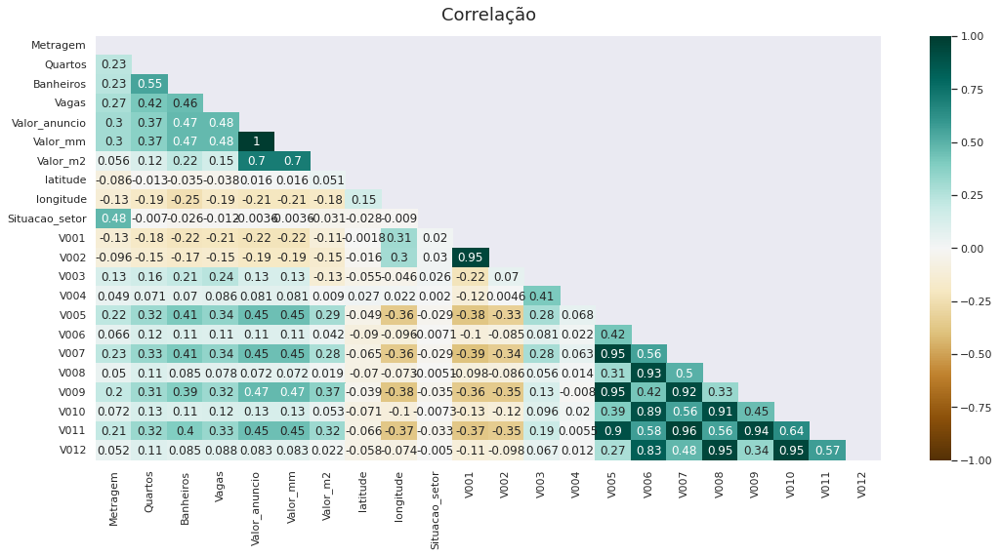

In [141]:
plt.figure(figsize=(18, 8))
#https://www.tylervigen.com/spurious-correlations
mask = np.triu(np.ones_like(dados_vendas_censo.corr(), dtype=bool))
heatmap = sns.heatmap(dados_vendas_censo.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlação', fontdict={'fontsize':18}, pad=16);

In [142]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X = dados_vendas_censo[["Metragem"]]
Y = dados_vendas_censo["Valor_anuncio"]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 54)
lr = LinearRegression()

In [143]:
lr.fit(X_train, Y_train)

LinearRegression()

In [144]:
Y_predict_test = lr.predict(X_test)

In [145]:
Y_test

172    4500000.00
4513    345000.00
4865    800000.00
4979   4000000.00
1255   5100000.00
          ...    
5240   1600000.00
4472    580000.00
3291   2200000.00
432    1500000.00
2455   2800000.00
Name: Valor_anuncio, Length: 1326, dtype: float64

In [146]:
Y_predict_train = lr.predict(X_train)

In [147]:
Y_train

3522    692000.00
881    1490000.00
769    2100000.00
3364   6700000.00
4674    622500.00
          ...    
3558   4280000.00
3994   1500000.00
5432   2300000.00
4044   1600000.00
948    3280000.00
Name: Valor_anuncio, Length: 3977, dtype: float64

In [148]:
mean_absolute_error(Y_test, Y_predict_test)

1770626.9062636306

In [149]:
mean_absolute_error(Y_train, Y_predict_train)

1825220.3034549057

In [150]:
r2_score(Y_train, Y_predict_train)

0.07399685087721253

In [151]:
X = dados_vendas_censo[['Metragem', 'Quartos', 'Banheiros', 'Vagas','V001','V007', 'V009']]

Y = dados_vendas_censo["Valor_anuncio"]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 54)
lr.fit(X_train, Y_train)
Y_predict_test = lr.predict(X_test)
Y_predict_train = lr.predict(X_train)
mae_test = mean_absolute_error(Y_test, Y_predict_test)
r2_test = r2_score(Y_test, Y_predict_test)
mae_train = mean_absolute_error(Y_train, Y_predict_train)
r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(mae_test))
print("r2_test: " + str(r2_test))
print("mae_train: " + str(mae_train))
print("r2_train: " + str(r2_train))

mae_test: 1349590.384432537
r2_test: 0.37745069254620534
mae_train: 1362945.691504754
r2_train: 0.39899592785823335


In [152]:
mae_test

1349590.384432537

In [153]:
r2_test

0.37745069254620534

In [154]:
mae_train

1362945.691504754

In [155]:
r2_train

0.39899592785823335

In [156]:
mae_test

1349590.384432537

In [157]:
r2_test

0.37745069254620534

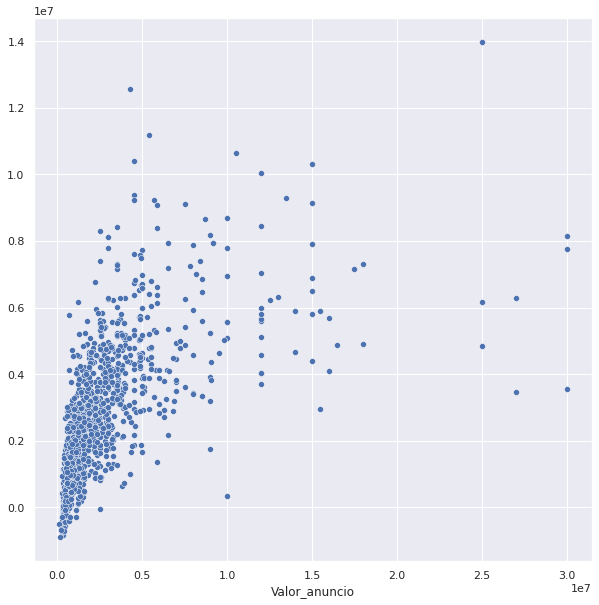

In [158]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y_test, y=Y_predict_test)

### Desafio Aula 5

1.   Adicionar o valor "real" do m2 do imóvel.

2.   Testar outro modelos de regressão.

3.   Criar um modelo baseline com as features originais.

4.   Trabalhar um pouco mais nos dados e criar novas variáveis.

5.   Testar as predições para casos reais.

### RandomForestRegressor

In [159]:
dados_vendas_censo.columns

Index(['Rua', 'Bairro', 'Cidade', 'Metragem', 'Quartos', 'Banheiros', 'Vagas',
       'Valor_anuncio', 'Valor_mm', 'Valor_m2', 'latitude', 'longitude',
       'Situacao_setor', 'V001', 'V002', 'V003', 'V004', 'V005', 'V006',
       'V007', 'V008', 'V009', 'V010', 'V011', 'V012'],
      dtype='object')

In [160]:
X = dados_vendas_censo[['Metragem', 'Quartos', 'Banheiros','Vagas','V001','V007', 'V009']]

Y = dados_vendas_censo["Valor_anuncio"]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 54)


rfr = RandomForestRegressor(n_estimators=300, random_state = 54)
rfr.fit(X_train, Y_train)
Y_predict_test = rfr.predict(X_test)
Y_predict_train = rfr.predict(X_train)
rfr_mae_test = mean_absolute_error(Y_test, Y_predict_test)
rfr_r2_test = r2_score(Y_test, Y_predict_test)
rfr_mae_train = mean_absolute_error(Y_train, Y_predict_train)
rfr_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(rfr_mae_test))
print("r2_test: " + str(rfr_r2_test))
print("mae_train: " + str(rfr_mae_train))
print("r2_train: " + str(rfr_r2_train))

mae_test: 745923.7584150645
r2_test: 0.724895945525554
mae_train: 263797.1456191447
r2_train: 0.9682985457797773


In [161]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot# Pull out one tree from the forest
tree = rfr.estimators_[5]# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot# Pull out one tree from the forest
tree = rfr.estimators_[5]# Export the image to a dot file
feature_list = list(X.columns)
export_graphviz(tree, out_file = 'tree.dot', feature_names = feature_list, rounded = True, precision = 1)# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')# Write graph to a png file
graph.write_png('tree.png')

### GradientBoostingRegressor

In [162]:
from sklearn.ensemble import GradientBoostingRegressor
est = GradientBoostingRegressor(n_estimators=300, learning_rate=0.1,
                                max_depth=10, random_state=54,
                                loss='squared_error')

est.fit(X_train, Y_train)
Y_predict_test = est.predict(X_test)
Y_predict_train = est.predict(X_train)
est_mae_test = mean_absolute_error(Y_test, Y_predict_test)
est_r2_test = r2_score(Y_test, Y_predict_test)
est_mae_train = mean_absolute_error(Y_train, Y_predict_train)
est_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(est_mae_test))
print("r2_test: " + str(est_r2_test))
print("mae_train: " + str(est_mae_train))
print("r2_train: " + str(est_r2_train))

mae_test: 692222.6592812268
r2_test: 0.6994198300444118
mae_train: 14903.404153296782
r2_train: 0.9998317635039116


### LGBM Regressor

In [163]:
from lightgbm import LGBMRegressor

In [164]:
lgbm = LGBMRegressor(boosting_type='gbdt', objective='regression',
                     num_leaves=1200, learning_rate=0.17,
                     n_estimators=300, max_depth=10, metric='rmse', 
                     bagging_fraction=0.8, feature_fraction=0.8, reg_lambda=0.9,
                     random_state=54)

lgbm.fit(X_train, Y_train)
Y_predict_test = lgbm.predict(X_test)
Y_predict_train = lgbm.predict(X_train)
lgbm_mae_test = mean_absolute_error(Y_test, Y_predict_test)
lgbm_r2_test = r2_score(Y_test, Y_predict_test)
lgbm_mae_train = mean_absolute_error(Y_train, Y_predict_train)
lgbm_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(lgbm_mae_test))
print("r2_test: " + str(lgbm_r2_test))
print("mae_train: " + str(lgbm_mae_train))
print("r2_train: " + str(lgbm_r2_train))

mae_test: 749597.861083938
r2_test: 0.7508124377457124
mae_train: 289910.9823913333
r2_train: 0.9788457330200692


### XGBoost Regressor

In [165]:
from xgboost.sklearn import XGBRegressor
xgb = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=10, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=1, nthread=None, objective='reg:squarederror', random_state=54,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

xgb.fit(X_train, Y_train)
Y_predict_test = xgb.predict(X_test)
Y_predict_train = xgb.predict(X_train)
xgb_mae_test = mean_absolute_error(Y_test, Y_predict_test)
xgb_r2_test = r2_score(Y_test, Y_predict_test)
xgb_mae_train = mean_absolute_error(Y_train, Y_predict_train)
xgb_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(xgb_mae_test))
print("r2_test: " + str(xgb_r2_test))
print("mae_train: " + str(xgb_mae_train))
print("r2_train: " + str(xgb_r2_train))

mae_test: 659781.3999457957
r2_test: 0.7389258449342733
mae_train: 29987.629262792307
r2_train: 0.9996676049171782


### CatBoost Regressor

In [166]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [167]:
from catboost import CatBoostRegressor
cat = CatBoostRegressor(max_depth=10, n_estimators=300,random_state=54,
                   loss_function='RMSE')
cat.fit(X_train, Y_train)
Y_predict_test = cat.predict(X_test)
Y_predict_train = cat.predict(X_train)
cat_mae_test = mean_absolute_error(Y_test, Y_predict_test)
cat_r2_test = r2_score(Y_test, Y_predict_test)
cat_mae_train = mean_absolute_error(Y_train, Y_predict_train)
cat_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(cat_mae_test))
print("r2_test: " + str(cat_r2_test))
print("mae_train: " + str(cat_mae_train))
print("r2_train: " + str(cat_r2_train))

Learning rate set to 0.135522
0:	learn: 2988393.8893561	total: 68ms	remaining: 20.3s
1:	learn: 2789014.7448155	total: 82.4ms	remaining: 12.3s
2:	learn: 2627004.2859877	total: 95.8ms	remaining: 9.48s
3:	learn: 2490332.8116823	total: 109ms	remaining: 8.06s
4:	learn: 2374825.9821382	total: 124ms	remaining: 7.3s
5:	learn: 2272152.2364080	total: 137ms	remaining: 6.7s
6:	learn: 2177575.4720889	total: 150ms	remaining: 6.26s
7:	learn: 2090569.4820400	total: 163ms	remaining: 5.93s
8:	learn: 2015491.6800902	total: 175ms	remaining: 5.66s
9:	learn: 1954555.6921850	total: 188ms	remaining: 5.45s
10:	learn: 1896485.6707429	total: 216ms	remaining: 5.68s
11:	learn: 1840826.7022729	total: 229ms	remaining: 5.49s
12:	learn: 1788376.6362652	total: 241ms	remaining: 5.33s
13:	learn: 1738992.3707651	total: 254ms	remaining: 5.19s
14:	learn: 1700651.6812161	total: 267ms	remaining: 5.07s
15:	learn: 1661236.7446400	total: 280ms	remaining: 4.96s
16:	learn: 1629351.1904589	total: 292ms	remaining: 4.86s
17:	learn: 1

### Stochastic Gradient Descent Regression

In [168]:
from sklearn.linear_model import SGDRegressor
sgd = SGDRegressor(random_state=54)

sgd.fit(X_train, Y_train)
Y_predict_test = sgd.predict(X_test)
Y_predict_train = sgd.predict(X_train)
sgd_mae_test = mean_absolute_error(Y_test, Y_predict_test)
sgd_r2_test = r2_score(Y_test, Y_predict_test)
sgd_mae_train = mean_absolute_error(Y_train, Y_predict_train)
sgd_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(sgd_mae_test))
print("r2_test: " + str(sgd_r2_test))
print("mae_train: " + str(sgd_mae_train))
print("r2_train: " + str(sgd_r2_train))

mae_test: 2.7142358900402576e+16
r2_test: -1.1771732443088159e+20
mae_train: 2.7610173948855748e+16
r2_train: -1.266038775460535e+20


### BayesianRidge

In [169]:
from sklearn.linear_model import BayesianRidge

br = BayesianRidge()

br.fit(X_train, Y_train)
Y_predict_test = br.predict(X_test)
Y_predict_train = br.predict(X_train)
br_mae_test = mean_absolute_error(Y_test, Y_predict_test)
br_r2_test = r2_score(Y_test, Y_predict_test)
br_mae_train = mean_absolute_error(Y_train, Y_predict_train)
br_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(br_mae_test))
print("r2_test: " + str(br_r2_test))
print("mae_train: " + str(br_mae_train))
print("r2_train: " + str(br_r2_train))

mae_test: 1347378.1805372376
r2_test: 0.3776940886711435
mae_train: 1360933.2545471573
r2_train: 0.39898658679671484


### Melhorando parâmetros do CatBoostRegressor

In [170]:
from sklearn.model_selection import GridSearchCV

model = CatBoostRegressor()
parameters = {'depth' : [6,8,10],
              'learning_rate' : [0.01, 0.05, 0.1],
              'iterations'    : [30, 50, 100, 1000],
              'random_state' : [54]
              }

grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 2, n_jobs=-1, scoring = 'r2')
grid.fit(X_train, Y_train)

0:	learn: 3058565.0835088	total: 2.19ms	remaining: 2.19s
1:	learn: 2913737.8078823	total: 3.96ms	remaining: 1.98s
2:	learn: 2785479.3402741	total: 5.79ms	remaining: 1.92s
3:	learn: 2676593.9334055	total: 7.99ms	remaining: 1.99s
4:	learn: 2569390.5365177	total: 10.2ms	remaining: 2.03s
5:	learn: 2485090.7002110	total: 12.3ms	remaining: 2.04s
6:	learn: 2409005.8751589	total: 14.4ms	remaining: 2.04s
7:	learn: 2345216.2634015	total: 16.2ms	remaining: 2.01s
8:	learn: 2282434.0308569	total: 18.2ms	remaining: 2s
9:	learn: 2229410.8077210	total: 20.1ms	remaining: 1.99s
10:	learn: 2182620.0119472	total: 22ms	remaining: 1.97s
11:	learn: 2146975.8578841	total: 23.8ms	remaining: 1.96s
12:	learn: 2107072.9058103	total: 25.6ms	remaining: 1.94s
13:	learn: 2074014.7802692	total: 27.4ms	remaining: 1.93s
14:	learn: 2041809.0222697	total: 29.5ms	remaining: 1.94s
15:	learn: 2014346.9666956	total: 31.6ms	remaining: 1.94s
16:	learn: 1987124.8484393	total: 33.7ms	remaining: 1.95s
17:	learn: 1963784.3858313	to

GridSearchCV(cv=2,
             estimator=<catboost.core.CatBoostRegressor object at 0x7f393a216210>,
             n_jobs=-1,
             param_grid={'depth': [6, 8, 10], 'iterations': [30, 50, 100, 1000],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'random_state': [54]},
             scoring='r2')

mae_test: 719001.5941137124

r2_test: 0.7653484196796952

mae_train: 306273.3773765655

r2_train: 0.9806846100166374

In [171]:
grid.best_params_

{'depth': 6, 'iterations': 1000, 'learning_rate': 0.1, 'random_state': 54}

In [172]:
from catboost import CatBoostRegressor
cat = CatBoostRegressor(max_depth=6, n_estimators=1000,random_state=54,
                        learning_rate=0.1, loss_function='RMSE',eval_metric = 'R2',
                        logging_level='Silent')
cat.fit(X_train, Y_train)
Y_predict_test = cat.predict(X_test)
Y_predict_train = cat.predict(X_train)
cat_mae_test = mean_absolute_error(Y_test, Y_predict_test)
cat_r2_test = r2_score(Y_test, Y_predict_test)
cat_mae_train = mean_absolute_error(Y_train, Y_predict_train)
cat_r2_train = r2_score(Y_train, Y_predict_train)
print("mae_test: " + str(cat_mae_test))
print("r2_test: " + str(cat_r2_test))
print("mae_train: " + str(cat_mae_train))
print("r2_train: " + str(cat_r2_train))

mae_test: 746285.7170339295
r2_test: 0.7546064766696523
mae_train: 347346.0044343422
r2_train: 0.975050730527111
